# Mushroom Ediblity Is a Classification Model

In [1]:
print(('*'*127))
print("                                                      MUSHROOM EDIBILITY                                                                 ")
print(('*'*127))

*******************************************************************************************************************************
                                                      MUSHROOM EDIBILITY                                                                 
*******************************************************************************************************************************


In [2]:
import pandas as pd
import numpy as np
import seaborn as sn

from matplotlib import pyplot as plt
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')

df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset1/master/mushrooms.csv")

df

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,e,k,s,n,f,n,a,c,b,y,...,s,o,o,p,o,o,p,b,c,l
8120,e,x,s,n,f,n,a,c,b,y,...,s,o,o,p,n,o,p,b,v,l
8121,e,f,s,n,f,n,a,c,b,n,...,s,o,o,p,o,o,p,b,c,l
8122,p,k,y,n,f,y,f,c,n,b,...,k,w,w,p,w,o,e,w,v,l


# Data Cleaning

In [156]:
df.drop('veil-type',axis=1, inplace=True)

KeyError: "['veil-type'] not found in axis"

In [4]:
print("We have 8124 rows and 23 columns")
df.shape

We have 8124 rows and 23 columns


(8124, 22)

In [5]:
print ("We have majority Object-type for all variables and Class is our target variable")
df.dtypes

We have majority Object-type for all variables and Class is our target variable


class                       object
cap-shape                   object
cap-surface                 object
cap-color                   object
bruises                     object
odor                        object
gill-attachment             object
gill-spacing                object
gill-size                   object
gill-color                  object
stalk-shape                 object
stalk-root                  object
stalk-surface-above-ring    object
stalk-surface-below-ring    object
stalk-color-above-ring      object
stalk-color-below-ring      object
veil-color                  object
ring-number                 object
ring-type                   object
spore-print-color           object
population                  object
habitat                     object
dtype: object

In [6]:
print("There are No Missing values, all values in the dataset are intact")
df.isnull().sum()


There are No Missing values, all values in the dataset are intact


class                       0
cap-shape                   0
cap-surface                 0
cap-color                   0
bruises                     0
odor                        0
gill-attachment             0
gill-spacing                0
gill-size                   0
gill-color                  0
stalk-shape                 0
stalk-root                  0
stalk-surface-above-ring    0
stalk-surface-below-ring    0
stalk-color-above-ring      0
stalk-color-below-ring      0
veil-color                  0
ring-number                 0
ring-type                   0
spore-print-color           0
population                  0
habitat                     0
dtype: int64

In [7]:
df.columns

Index(['class', 'cap-shape', 'cap-surface', 'cap-color', 'bruises', 'odor',
       'gill-attachment', 'gill-spacing', 'gill-size', 'gill-color',
       'stalk-shape', 'stalk-root', 'stalk-surface-above-ring',
       'stalk-surface-below-ring', 'stalk-color-above-ring',
       'stalk-color-below-ring', 'veil-color', 'ring-number', 'ring-type',
       'spore-print-color', 'population', 'habitat'],
      dtype='object')

In [8]:
pd.set_option('display.max_rows', 9000)
pd.set_option('display.max_columns', 23)
pd.set_option('display.width',100)

df

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,e,e,s,s,w,w,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,e,c,s,s,w,w,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,e,c,s,s,w,w,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,e,e,s,s,w,w,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,t,e,s,s,w,w,w,o,e,n,a,g
5,e,x,y,y,t,a,f,c,b,n,e,c,s,s,w,w,w,o,p,k,n,g
6,e,b,s,w,t,a,f,c,b,g,e,c,s,s,w,w,w,o,p,k,n,m
7,e,b,y,w,t,l,f,c,b,n,e,c,s,s,w,w,w,o,p,n,s,m
8,p,x,y,w,t,p,f,c,n,p,e,e,s,s,w,w,w,o,p,k,v,g
9,e,b,s,y,t,a,f,c,b,g,e,c,s,s,w,w,w,o,p,k,s,m


In [9]:
print("As we have found all columns with unique string variables we perform a unique check")

As we have found all columns with unique string variables we perform a unique check


In [10]:
print("As we have found all columns with unique string variables we perform a unique check")
df['class'].value_counts()

As we have found all columns with unique string variables we perform a unique check


e    4208
p    3916
Name: class, dtype: int64

In [11]:
df['cap-shape'].value_counts()

x    3656
f    3152
k     828
b     452
s      32
c       4
Name: cap-shape, dtype: int64

In [12]:
df['cap-surface'].value_counts()

y    3244
s    2556
f    2320
g       4
Name: cap-surface, dtype: int64

In [13]:
df['cap-color'].value_counts()

n    2284
g    1840
e    1500
y    1072
w    1040
b     168
p     144
c      44
u      16
r      16
Name: cap-color, dtype: int64

In [14]:
df['bruises'].value_counts()

f    4748
t    3376
Name: bruises, dtype: int64

In [15]:
df['odor'].value_counts()

n    3528
f    2160
s     576
y     576
a     400
l     400
p     256
c     192
m      36
Name: odor, dtype: int64

In [16]:
df['gill-attachment'].value_counts()

f    7914
a     210
Name: gill-attachment, dtype: int64

In [17]:
df['gill-spacing'].value_counts()

c    6812
w    1312
Name: gill-spacing, dtype: int64

In [18]:
df['gill-size'].value_counts()

b    5612
n    2512
Name: gill-size, dtype: int64

In [19]:
df['gill-color'].value_counts()

b    1728
p    1492
w    1202
n    1048
g     752
h     732
u     492
k     408
e      96
y      86
o      64
r      24
Name: gill-color, dtype: int64

In [20]:
df['stalk-shape'].value_counts()

t    4608
e    3516
Name: stalk-shape, dtype: int64

In [21]:
df['stalk-root'].value_counts()

b    3776
?    2480
e    1120
c     556
r     192
Name: stalk-root, dtype: int64

In [22]:
df['stalk-surface-above-ring'].value_counts()

s    5176
k    2372
f     552
y      24
Name: stalk-surface-above-ring, dtype: int64

In [23]:
df['stalk-surface-below-ring'].value_counts()

s    4936
k    2304
f     600
y     284
Name: stalk-surface-below-ring, dtype: int64

In [24]:
df['stalk-color-above-ring'].value_counts()

w    4464
p    1872
g     576
n     448
b     432
o     192
e      96
c      36
y       8
Name: stalk-color-above-ring, dtype: int64

In [25]:
df['stalk-color-below-ring'].value_counts()

w    4384
p    1872
g     576
n     512
b     432
o     192
e      96
c      36
y      24
Name: stalk-color-below-ring, dtype: int64

In [26]:
df['veil-color'].value_counts()

w    7924
o      96
n      96
y       8
Name: veil-color, dtype: int64

In [27]:
df['ring-number'].value_counts()

o    7488
t     600
n      36
Name: ring-number, dtype: int64

In [28]:
df['ring-type'].value_counts()

p    3968
e    2776
l    1296
f      48
n      36
Name: ring-type, dtype: int64

In [29]:
df['spore-print-color'].value_counts()

w    2388
n    1968
k    1872
h    1632
r      72
u      48
b      48
o      48
y      48
Name: spore-print-color, dtype: int64

In [30]:
df['population'].value_counts()

v    4040
y    1712
s    1248
n     400
a     384
c     340
Name: population, dtype: int64

In [31]:
df['habitat'].value_counts()

d    3148
g    2148
p    1144
l     832
u     368
m     292
w     192
Name: habitat, dtype: int64

# Dataset Descirption

This data set includes descriptions of hypothetical samples corresponding to 23 species of gilled mushrooms in the Agaricus and Lepiota Family (pp. 500-525).

Each species is identified as definitely edible, definitely poisonous, or of unknown edibility and not recommended.

This latter class was combined with the poisonous one. The Guide clearly states that there is no simple rule for determining the edibility of a mushroom; no rule like ``leaflets three, let it be''.


# Attributes

This data set includes descriptions of hypothetical samples corresponding to 23 species of gilled mushrooms in the Agaricus and Lepiota Family (pp. 500-525).

---class	
---cap-shape	
---cap-surface	
---cap-color	
---bruises	odor	
---gill-attachment	
---gill-spacing	
---gill-size	
---gill-color	
---stalk-shape	
---stalk-root	
---stalk-surface-above-ring	
---stalk-surface-below-ring	
---stalk-color-above-ring	
---stalk-color-below-ring	
---veil-type	
---veil-color	
---ring-number	
---ring-type	
---spore-print-color	
---population	
---habitat



# EDA

# Displot

In [32]:
from  sklearn.preprocessing import LabelEncoder

lb = LabelEncoder()
df["class"] = lb.fit_transform(df["class"])

df["class"]

0       1
1       0
2       0
3       1
4       0
5       0
6       0
7       0
8       1
9       0
10      0
11      0
12      0
13      1
14      0
15      0
16      0
17      1
18      1
19      1
20      0
21      1
22      0
23      0
24      0
25      1
26      0
27      0
28      0
29      0
30      0
31      1
32      0
33      0
34      0
35      0
36      0
37      1
38      0
39      0
40      0
41      0
42      0
43      1
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      1
54      1
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      1
79      0
80      0
81      1
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


<AxesSubplot:xlabel='class', ylabel='Density'>

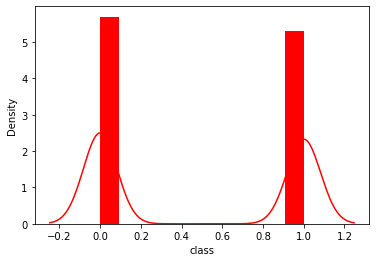

In [33]:
sn.distplot(df["class"], hist_kws={'alpha':1}, color='r')

In [34]:
df["cap-shape"] = lb.fit_transform(df["cap-shape"])
df["cap-shape"]

0       5
1       5
2       0
3       5
4       5
5       5
6       0
7       0
8       5
9       0
10      5
11      5
12      0
13      5
14      5
15      4
16      2
17      5
18      5
19      5
20      0
21      5
22      0
23      0
24      0
25      2
26      5
27      5
28      2
29      5
30      0
31      5
32      5
33      5
34      0
35      5
36      4
37      5
38      5
39      0
40      0
41      5
42      5
43      5
44      5
45      5
46      5
47      5
48      5
49      2
50      5
51      5
52      0
53      5
54      5
55      0
56      2
57      0
58      5
59      5
60      4
61      0
62      0
63      0
64      0
65      2
66      5
67      2
68      5
69      5
70      2
71      0
72      2
73      5
74      0
75      2
76      5
77      2
78      5
79      2
80      5
81      5
82      2
83      5
84      5
85      5
86      0
87      5
88      2
89      4
90      5
91      0
92      5
93      5
94      5
95      5
96      2
97      5
98      0
99      5


<AxesSubplot:xlabel='cap-shape', ylabel='Density'>

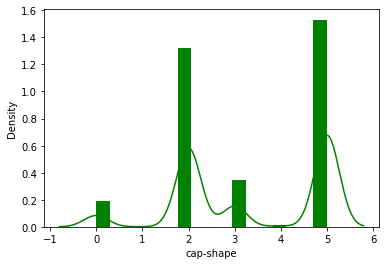

In [35]:
sn.distplot(df["cap-shape"], hist_kws={'alpha':1}, color='g')

In [36]:
df["cap-surface"] = lb.fit_transform(df["cap-surface"])
df["cap-surface"]

0       2
1       2
2       2
3       3
4       2
5       3
6       2
7       3
8       3
9       2
10      3
11      3
12      2
13      3
14      0
15      0
16      0
17      2
18      3
19      2
20      2
21      3
22      3
23      3
24      2
25      2
26      3
27      3
28      0
29      2
30      2
31      3
32      3
33      3
34      3
35      0
36      0
37      3
38      0
39      2
40      3
41      3
42      0
43      3
44      2
45      3
46      3
47      2
48      3
49      3
50      3
51      2
52      2
53      3
54      2
55      3
56      0
57      2
58      2
59      3
60      0
61      3
62      2
63      3
64      3
65      2
66      2
67      3
68      3
69      0
70      0
71      3
72      0
73      3
74      2
75      2
76      2
77      3
78      3
79      3
80      2
81      3
82      0
83      0
84      3
85      2
86      2
87      2
88      3
89      0
90      0
91      2
92      3
93      3
94      2
95      2
96      3
97      2
98      2
99      3


<AxesSubplot:xlabel='cap-surface', ylabel='Density'>

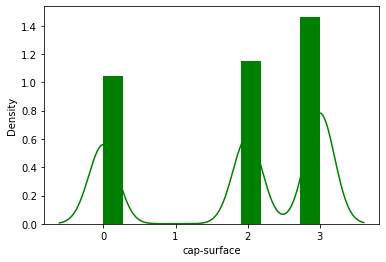

In [37]:
sn.distplot(df["cap-surface"], hist_kws={'alpha':1}, color='g')

In [38]:
df["cap-color"] = lb.fit_transform(df["cap-color"])
df["cap-color"]

0       4
1       9
2       8
3       8
4       3
5       9
6       8
7       8
8       8
9       9
10      9
11      9
12      9
13      8
14      4
15      3
16      8
17      4
18      8
19      4
20      9
21      4
22      9
23      8
24      8
25      8
26      9
27      8
28      4
29      9
30      9
31      8
32      9
33      4
34      9
35      9
36      3
37      4
38      9
39      9
40      9
41      9
42      4
43      8
44      9
45      8
46      9
47      8
48      9
49      9
50      4
51      8
52      8
53      4
54      8
55      9
56      3
57      8
58      9
59      4
60      3
61      9
62      9
63      9
64      8
65      4
66      8
67      9
68      9
69      3
70      9
71      8
72      9
73      4
74      9
75      9
76      8
77      4
78      4
79      4
80      4
81      8
82      3
83      3
84      9
85      4
86      8
87      8
88      4
89      4
90      4
91      8
92      9
93      9
94      4
95      8
96      4
97      9
98      8
99      8


<AxesSubplot:xlabel='cap-color', ylabel='Density'>

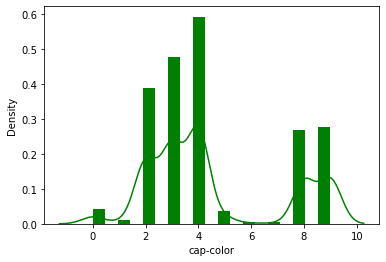

In [39]:
sn.distplot(df["cap-color"], hist_kws={'alpha':1}, color='g')

In [40]:
df["bruises"] = lb.fit_transform(df["bruises"])
df["bruises"]

0       1
1       1
2       1
3       1
4       0
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      0
15      0
16      0
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      0
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      0
37      1
38      1
39      1
40      1
41      1
42      0
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      0
57      1
58      1
59      1
60      0
61      1
62      1
63      1
64      1
65      0
66      1
67      1
68      1
69      0
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      0
81      1
82      0
83      0
84      1
85      0
86      1
87      1
88      1
89      0
90      0
91      1
92      1
93      1
94      0
95      1
96      1
97      1
98      1
99      1


<AxesSubplot:xlabel='bruises', ylabel='Density'>

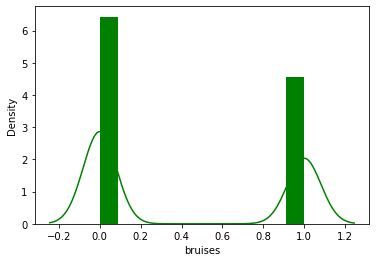

In [41]:
sn.distplot(df["bruises"], hist_kws={'alpha':1}, color='g')

In [42]:
df["odor"] = lb.fit_transform(df["odor"])
df["odor"]

0       6
1       0
2       3
3       6
4       5
5       0
6       0
7       3
8       6
9       0
10      3
11      0
12      0
13      6
14      5
15      5
16      5
17      6
18      6
19      6
20      0
21      6
22      3
23      0
24      3
25      6
26      0
27      3
28      5
29      0
30      3
31      6
32      3
33      3
34      3
35      3
36      5
37      6
38      0
39      3
40      0
41      3
42      5
43      6
44      0
45      0
46      3
47      3
48      3
49      3
50      0
51      3
52      3
53      6
54      6
55      0
56      5
57      0
58      3
59      0
60      5
61      0
62      3
63      3
64      3
65      5
66      3
67      0
68      0
69      5
70      3
71      3
72      3
73      0
74      0
75      3
76      3
77      3
78      6
79      0
80      5
81      6
82      5
83      5
84      3
85      5
86      0
87      3
88      3
89      5
90      5
91      3
92      0
93      3
94      5
95      0
96      3
97      0
98      0
99      0


<AxesSubplot:xlabel='odor', ylabel='Density'>

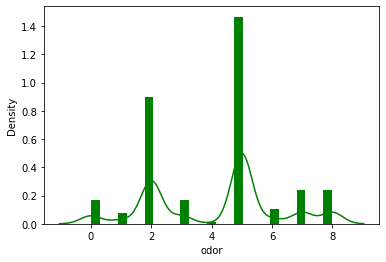

In [43]:
sn.distplot(df["odor"], hist_kws={'alpha':1}, color='g')

In [44]:
df["gill-attachment"] = lb.fit_transform(df["gill-attachment"])
df["gill-attachment"]

0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1
99      1


<AxesSubplot:xlabel='gill-attachment', ylabel='Density'>

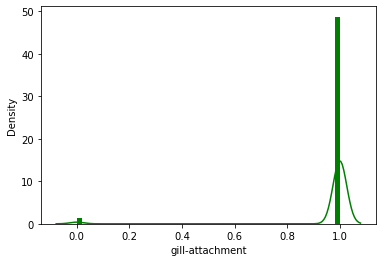

In [45]:
sn.distplot(df["gill-attachment"], hist_kws={'alpha':1}, color='g')

In [46]:
df["gill-spacing"] = lb.fit_transform(df["gill-spacing"])
df["gill-spacing"]

0       0
1       0
2       0
3       0
4       1
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      1
15      0
16      1
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      1
30      0
31      0
32      0
33      0
34      0
35      1
36      0
37      0
38      1
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      1
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      1
66      0
67      0
68      0
69      0
70      1
71      0
72      1
73      0
74      0
75      1
76      1
77      0
78      0
79      0
80      1
81      0
82      0
83      1
84      0
85      1
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      1
95      0
96      0
97      0
98      0
99      0


<AxesSubplot:xlabel='gill-spacing', ylabel='Density'>

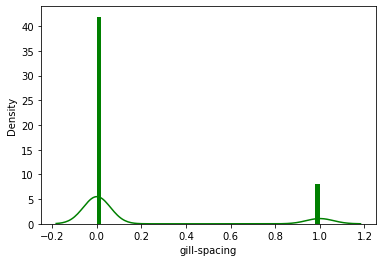

In [47]:
sn.distplot(df["gill-spacing"], hist_kws={'alpha':1}, color='g')

In [48]:
df["gill-size"] = lb.fit_transform(df["gill-size"])
df["gill-size"]

0       1
1       0
2       0
3       1
4       0
5       0
6       0
7       0
8       1
9       0
10      0
11      0
12      0
13      1
14      0
15      1
16      0
17      1
18      1
19      1
20      0
21      1
22      0
23      0
24      0
25      1
26      0
27      0
28      1
29      1
30      0
31      1
32      0
33      0
34      0
35      1
36      1
37      1
38      1
39      0
40      0
41      0
42      1
43      1
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      1
54      1
55      0
56      0
57      0
58      0
59      0
60      1
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      1
70      1
71      0
72      1
73      0
74      0
75      1
76      1
77      0
78      1
79      0
80      0
81      1
82      1
83      0
84      0
85      0
86      0
87      0
88      0
89      1
90      1
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


<AxesSubplot:xlabel='gill-size', ylabel='Density'>

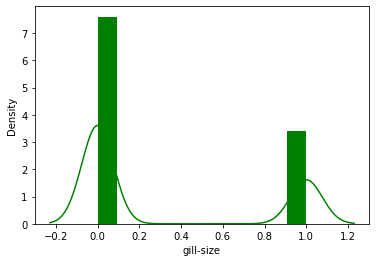

In [49]:
sn.distplot(df["gill-size"], hist_kws={'alpha':1}, color='g')

In [50]:
df["gill-color"] = lb.fit_transform(df["gill-color"])
df["gill-color"]

0        4
1        4
2        5
3        5
4        4
5        5
6        2
7        5
8        7
9        2
10       2
11       5
12      10
13       4
14       5
15       4
16       4
17       5
18       5
19       4
20       4
21       5
22       4
23      10
24       2
25       5
26       5
27      10
28       4
29       5
30       2
31       4
32       5
33       7
34       5
35      10
36       4
37      10
38       7
39       4
40       5
41       5
42       2
43       7
44      10
45       5
46       4
47      10
48       5
49      10
50      10
51       4
52       4
53       4
54       4
55      10
56       5
57      10
58       4
59       7
60       4
61       4
62       2
63       2
64       5
65       4
66       5
67      10
68      10
69       7
70       7
71       2
72      10
73       7
74       4
75       7
76       5
77       7
78      10
79       5
80       4
81      10
82       5
83       5
84      10
85       4
86      10
87       5
88      10
89       5
90       5

<AxesSubplot:xlabel='gill-color', ylabel='Density'>

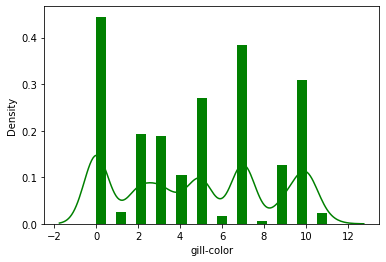

In [51]:
sn.distplot(df["gill-color"], hist_kws={'alpha':1}, color='g')

In [52]:
df["stalk-shape"] = lb.fit_transform(df["stalk-shape"])
df["stalk-shape"]

0       0
1       0
2       0
3       0
4       1
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      1
15      0
16      1
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      1
30      0
31      0
32      0
33      0
34      0
35      1
36      0
37      0
38      1
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      1
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      1
66      0
67      0
68      0
69      0
70      1
71      0
72      1
73      0
74      0
75      1
76      1
77      0
78      0
79      0
80      1
81      0
82      0
83      1
84      0
85      1
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      1
95      0
96      0
97      0
98      0
99      0


<AxesSubplot:xlabel='stalk-shape', ylabel='Density'>

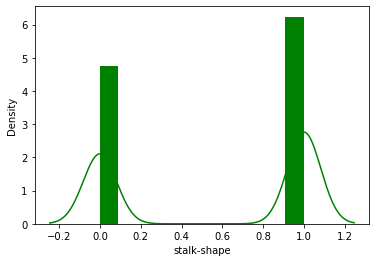

In [53]:
sn.distplot(df["stalk-shape"], hist_kws={'alpha':1}, color='g')

In [54]:
df["stalk-root"] = lb.fit_transform(df["stalk-root"])
df["stalk-root"]

0       3
1       2
2       2
3       3
4       3
5       2
6       2
7       2
8       3
9       2
10      2
11      2
12      2
13      3
14      3
15      3
16      3
17      3
18      3
19      3
20      2
21      3
22      2
23      2
24      2
25      3
26      2
27      2
28      3
29      1
30      2
31      3
32      2
33      4
34      2
35      1
36      3
37      3
38      1
39      2
40      2
41      4
42      3
43      3
44      2
45      2
46      2
47      2
48      4
49      4
50      4
51      2
52      2
53      3
54      3
55      2
56      3
57      2
58      2
59      4
60      3
61      2
62      2
63      2
64      2
65      3
66      2
67      4
68      2
69      3
70      1
71      2
72      1
73      4
74      2
75      1
76      1
77      4
78      3
79      4
80      3
81      3
82      3
83      3
84      4
85      3
86      2
87      2
88      4
89      3
90      3
91      2
92      2
93      2
94      3
95      2
96      4
97      2
98      2
99      2


<AxesSubplot:xlabel='stalk-root', ylabel='Density'>

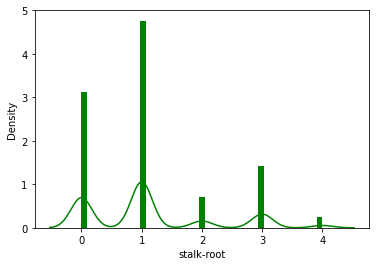

In [55]:
sn.distplot(df["stalk-root"], hist_kws={'alpha':1}, color='g')

In [56]:
df["stalk-surface-above-ring"] = lb.fit_transform(df["stalk-surface-above-ring"])
df["stalk-surface-above-ring"]

0       2
1       2
2       2
3       2
4       2
5       2
6       2
7       2
8       2
9       2
10      2
11      2
12      2
13      2
14      2
15      2
16      2
17      2
18      2
19      2
20      2
21      2
22      2
23      2
24      2
25      2
26      2
27      2
28      2
29      2
30      2
31      2
32      2
33      2
34      2
35      2
36      2
37      2
38      2
39      2
40      2
41      2
42      2
43      2
44      2
45      2
46      2
47      2
48      2
49      2
50      2
51      2
52      2
53      2
54      2
55      2
56      2
57      2
58      2
59      2
60      2
61      2
62      2
63      2
64      2
65      2
66      2
67      2
68      2
69      2
70      2
71      2
72      2
73      2
74      2
75      2
76      2
77      2
78      2
79      2
80      0
81      2
82      2
83      2
84      2
85      2
86      2
87      2
88      2
89      2
90      2
91      2
92      2
93      2
94      2
95      2
96      2
97      2
98      2
99      2


<AxesSubplot:xlabel='stalk-surface-above-ring', ylabel='Density'>

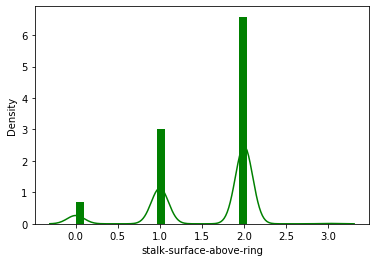

In [57]:
sn.distplot(df["stalk-surface-above-ring"],hist_kws={'alpha':1}, color='g')

In [58]:
df["stalk-surface-below-ring"] = lb.fit_transform(df["stalk-surface-below-ring"])
df["stalk-surface-below-ring"]

0       2
1       2
2       2
3       2
4       2
5       2
6       2
7       2
8       2
9       2
10      2
11      2
12      2
13      2
14      0
15      2
16      2
17      2
18      2
19      2
20      2
21      2
22      2
23      2
24      2
25      2
26      2
27      2
28      2
29      2
30      2
31      2
32      2
33      3
34      2
35      2
36      2
37      2
38      2
39      2
40      2
41      3
42      2
43      2
44      2
45      2
46      2
47      2
48      3
49      3
50      3
51      2
52      2
53      2
54      2
55      2
56      2
57      2
58      2
59      3
60      2
61      2
62      2
63      2
64      2
65      2
66      2
67      3
68      2
69      2
70      2
71      2
72      2
73      3
74      2
75      2
76      2
77      3
78      2
79      3
80      2
81      2
82      2
83      2
84      3
85      2
86      2
87      2
88      3
89      2
90      2
91      2
92      2
93      2
94      2
95      2
96      3
97      2
98      2
99      2


<AxesSubplot:xlabel='stalk-surface-below-ring', ylabel='Density'>

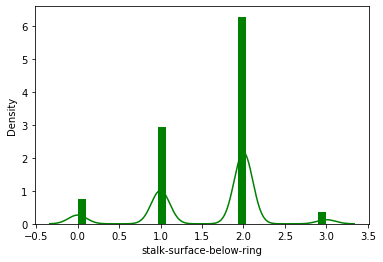

In [59]:
sn.distplot(df["stalk-surface-below-ring"], hist_kws={'alpha':1}, color='g')

In [60]:
df["stalk-color-above-ring"] = lb.fit_transform(df["stalk-color-above-ring"])
df["stalk-color-above-ring"]

0       7
1       7
2       7
3       7
4       7
5       7
6       7
7       7
8       7
9       7
10      7
11      7
12      7
13      7
14      7
15      7
16      7
17      7
18      7
19      7
20      7
21      7
22      7
23      7
24      7
25      7
26      7
27      7
28      7
29      7
30      7
31      7
32      7
33      7
34      7
35      7
36      7
37      7
38      7
39      7
40      7
41      7
42      7
43      7
44      7
45      7
46      7
47      7
48      7
49      7
50      7
51      7
52      7
53      7
54      7
55      7
56      7
57      7
58      7
59      7
60      7
61      7
62      7
63      7
64      7
65      7
66      7
67      7
68      7
69      7
70      7
71      7
72      7
73      7
74      7
75      7
76      7
77      7
78      7
79      7
80      7
81      7
82      7
83      7
84      7
85      7
86      7
87      7
88      7
89      7
90      7
91      7
92      7
93      7
94      7
95      7
96      7
97      7
98      7
99      7


<AxesSubplot:xlabel='stalk-color-above-ring', ylabel='Density'>

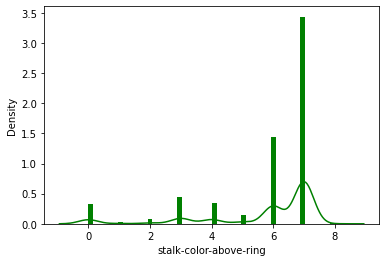

In [61]:
sn.distplot(df["stalk-color-above-ring"], hist_kws={'alpha':1}, color='g')

In [62]:
df["stalk-color-below-ring"] = lb.fit_transform(df["stalk-color-below-ring"])
df["stalk-color-below-ring"]

0       7
1       7
2       7
3       7
4       7
5       7
6       7
7       7
8       7
9       7
10      7
11      7
12      7
13      7
14      7
15      7
16      7
17      7
18      7
19      7
20      7
21      7
22      7
23      7
24      7
25      7
26      7
27      7
28      7
29      7
30      7
31      7
32      7
33      7
34      7
35      7
36      7
37      7
38      7
39      7
40      7
41      7
42      7
43      7
44      7
45      7
46      7
47      7
48      7
49      7
50      7
51      7
52      7
53      7
54      7
55      7
56      7
57      7
58      7
59      7
60      7
61      7
62      7
63      7
64      7
65      7
66      7
67      7
68      7
69      7
70      7
71      7
72      7
73      7
74      7
75      7
76      7
77      7
78      7
79      7
80      7
81      7
82      7
83      7
84      7
85      7
86      7
87      7
88      7
89      7
90      7
91      7
92      7
93      7
94      7
95      7
96      7
97      7
98      7
99      7


<AxesSubplot:xlabel='stalk-color-below-ring', ylabel='Density'>

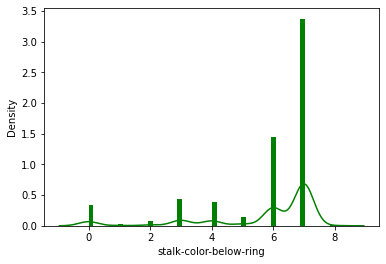

In [63]:
sn.distplot(df["stalk-color-below-ring"], hist_kws={'alpha':1}, color='g')

In [64]:
df["veil-color"] = lb.fit_transform(df["veil-color"])
df["veil-color"]

0       2
1       2
2       2
3       2
4       2
5       2
6       2
7       2
8       2
9       2
10      2
11      2
12      2
13      2
14      2
15      2
16      2
17      2
18      2
19      2
20      2
21      2
22      2
23      2
24      2
25      2
26      2
27      2
28      2
29      2
30      2
31      2
32      2
33      2
34      2
35      2
36      2
37      2
38      2
39      2
40      2
41      2
42      2
43      2
44      2
45      2
46      2
47      2
48      2
49      2
50      2
51      2
52      2
53      2
54      2
55      2
56      2
57      2
58      2
59      2
60      2
61      2
62      2
63      2
64      2
65      2
66      2
67      2
68      2
69      2
70      2
71      2
72      2
73      2
74      2
75      2
76      2
77      2
78      2
79      2
80      2
81      2
82      2
83      2
84      2
85      2
86      2
87      2
88      2
89      2
90      2
91      2
92      2
93      2
94      2
95      2
96      2
97      2
98      2
99      2


<AxesSubplot:xlabel='veil-color', ylabel='Density'>

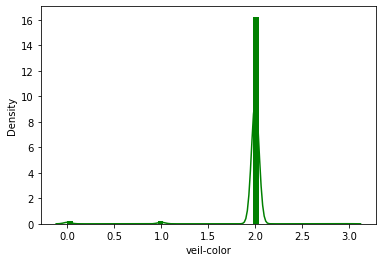

In [65]:
sn.distplot(df["veil-color"], hist_kws={'alpha':1}, color='g')

In [66]:
df["ring-number"] = lb.fit_transform(df["ring-number"])
df["ring-number"]

0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1
99      1


<AxesSubplot:xlabel='ring-number', ylabel='Density'>

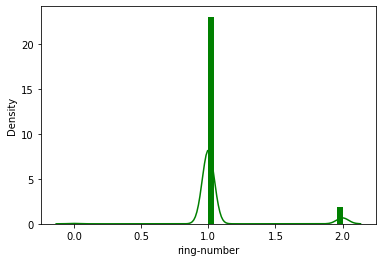

In [67]:
sn.distplot(df["ring-number"], hist_kws={'alpha':1}, color='g')

In [68]:
df["ring-type"] = lb.fit_transform(df["ring-type"])
df["ring-type"]

0       4
1       4
2       4
3       4
4       0
5       4
6       4
7       4
8       4
9       4
10      4
11      4
12      4
13      4
14      0
15      4
16      0
17      4
18      4
19      4
20      4
21      4
22      4
23      4
24      4
25      4
26      4
27      4
28      4
29      4
30      4
31      4
32      4
33      4
34      4
35      4
36      4
37      4
38      4
39      4
40      4
41      4
42      4
43      4
44      4
45      4
46      4
47      4
48      4
49      4
50      4
51      4
52      4
53      4
54      4
55      4
56      0
57      4
58      4
59      4
60      4
61      4
62      4
63      4
64      4
65      0
66      4
67      4
68      4
69      4
70      4
71      4
72      4
73      4
74      4
75      4
76      4
77      4
78      4
79      4
80      0
81      4
82      4
83      0
84      4
85      0
86      4
87      4
88      4
89      4
90      4
91      4
92      4
93      4
94      0
95      4
96      4
97      4
98      4
99      4


<AxesSubplot:xlabel='ring-type', ylabel='Density'>

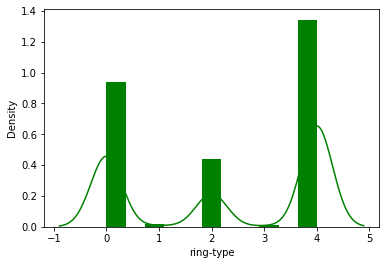

In [69]:
sn.distplot(df["ring-type"], hist_kws={'alpha':1}, color='g')

In [70]:
df["spore-print-color"] = lb.fit_transform(df["spore-print-color"])
df["spore-print-color"]

0       2
1       3
2       3
3       2
4       3
5       2
6       2
7       3
8       2
9       2
10      3
11      2
12      3
13      3
14      2
15      3
16      3
17      2
18      3
19      3
20      3
21      3
22      3
23      3
24      2
25      3
26      3
27      3
28      2
29      3
30      3
31      3
32      3
33      3
34      3
35      3
36      2
37      3
38      3
39      2
40      3
41      2
42      2
43      3
44      2
45      3
46      2
47      3
48      3
49      2
50      2
51      2
52      3
53      3
54      2
55      2
56      3
57      3
58      2
59      2
60      3
61      3
62      3
63      3
64      3
65      2
66      2
67      3
68      2
69      3
70      3
71      3
72      3
73      2
74      2
75      3
76      6
77      3
78      3
79      3
80      3
81      2
82      3
83      3
84      2
85      2
86      2
87      3
88      2
89      3
90      3
91      2
92      2
93      2
94      3
95      3
96      3
97      2
98      3
99      2


<AxesSubplot:xlabel='spore-print-color', ylabel='Density'>

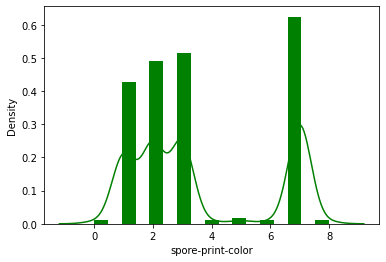

In [71]:
sn.distplot(df["spore-print-color"], hist_kws={'alpha':1}, color='g')

In [72]:
df["population"] = lb.fit_transform(df["population"])
df["population"]

0       3
1       2
2       2
3       3
4       0
5       2
6       2
7       3
8       4
9       3
10      2
11      3
12      3
13      4
14      0
15      5
16      0
17      3
18      3
19      3
20      3
21      4
22      3
23      2
24      3
25      4
26      2
27      2
28      5
29      4
30      2
31      3
32      2
33      5
34      3
35      4
36      4
37      3
38      4
39      3
40      3
41      5
42      5
43      4
44      2
45      2
46      3
47      2
48      3
49      3
50      3
51      3
52      2
53      4
54      4
55      3
56      0
57      2
58      2
59      5
60      4
61      3
62      3
63      2
64      3
65      0
66      3
67      3
68      2
69      4
70      4
71      3
72      4
73      3
74      3
75      4
76      4
77      5
78      4
79      5
80      3
81      3
82      5
83      3
84      3
85      3
86      3
87      3
88      5
89      4
90      5
91      3
92      3
93      2
94      0
95      3
96      3
97      2
98      3
99      3


<AxesSubplot:xlabel='population', ylabel='Density'>

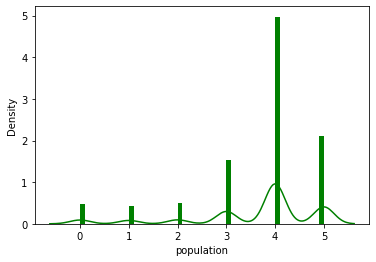

In [73]:
sn.distplot(df["population"], hist_kws={'alpha':1}, color='g')

In [74]:
df["habitat"] = lb.fit_transform(df["habitat"])
df["habitat"]

0       5
1       1
2       3
3       5
4       1
5       1
6       3
7       3
8       1
9       3
10      1
11      3
12      1
13      5
14      1
15      5
16      1
17      1
18      5
19      5
20      3
21      1
22      3
23      3
24      3
25      1
26      3
27      3
28      5
29      0
30      3
31      5
32      3
33      4
34      3
35      0
36      5
37      5
38      0
39      3
40      1
41      4
42      5
43      1
44      3
45      1
46      3
47      3
48      4
49      4
50      1
51      1
52      3
53      5
54      5
55      3
56      1
57      1
58      1
59      4
60      5
61      3
62      3
63      3
64      1
65      1
66      1
67      1
68      1
69      5
70      0
71      3
72      0
73      4
74      1
75      0
76      0
77      4
78      5
79      1
80      1
81      1
82      5
83      1
84      1
85      1
86      1
87      1
88      1
89      5
90      5
91      1
92      1
93      3
94      1
95      1
96      1
97      1
98      1
99      1


<AxesSubplot:xlabel='habitat', ylabel='Density'>

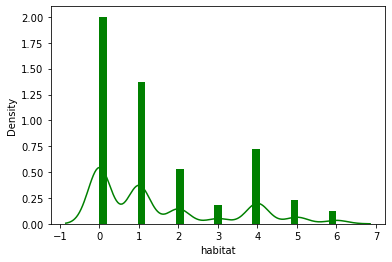

In [75]:
sn.distplot(df["habitat"], hist_kws={'alpha':1}, color='g')

In [76]:
print("In the above displot, we observe No skewness on Target column")

In the above displot, we observe No skewness on Target column


# Boxplot

<AxesSubplot:xlabel='class'>

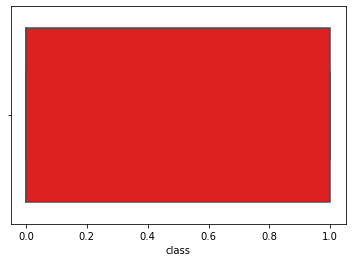

In [77]:
sn.boxplot(df["class"], color='r')

<AxesSubplot:xlabel='cap-shape'>

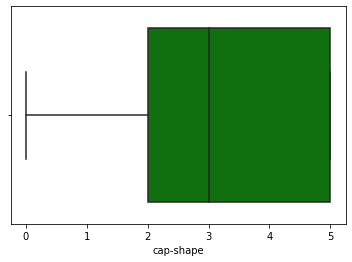

In [78]:
sn.boxplot(df["cap-shape"], color='g')

<AxesSubplot:xlabel='cap-surface'>

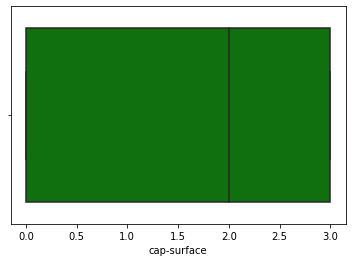

In [79]:
sn.boxplot(df["cap-surface"], color='g')

<AxesSubplot:xlabel='cap-color'>

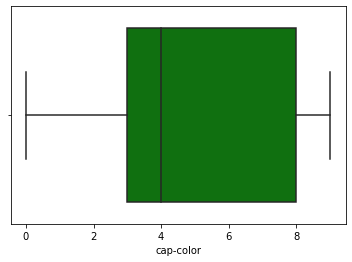

In [80]:
sn.boxplot(df["cap-color"], color='g')

<AxesSubplot:xlabel='bruises'>

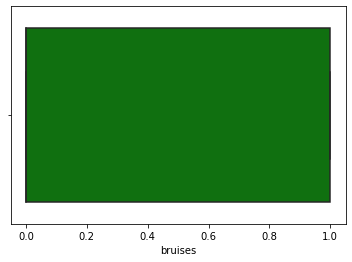

In [81]:
sn.boxplot(df["bruises"], color='g')

<AxesSubplot:xlabel='odor'>

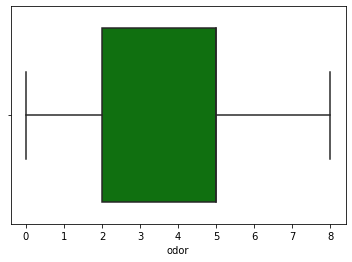

In [82]:
sn.boxplot(df["odor"], color='g')

<AxesSubplot:xlabel='gill-attachment'>

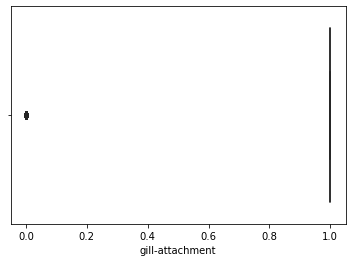

In [83]:
sn.boxplot(df["gill-attachment"], color='g')

<AxesSubplot:xlabel='gill-spacing'>

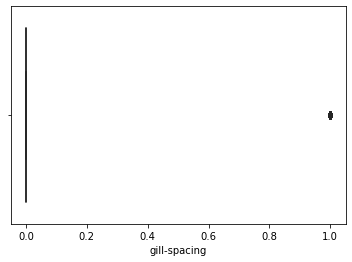

In [84]:
sn.boxplot(df["gill-spacing"], color='g')

<AxesSubplot:xlabel='gill-size'>

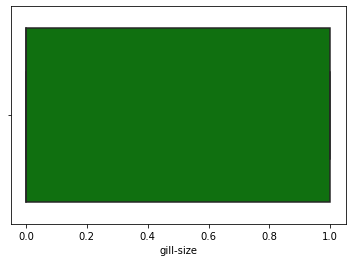

In [85]:
sn.boxplot(df["gill-size"], color='g')

<AxesSubplot:xlabel='gill-color'>

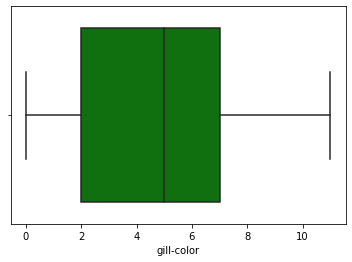

In [86]:
sn.boxplot(df["gill-color"], color='g')

<AxesSubplot:xlabel='stalk-shape'>

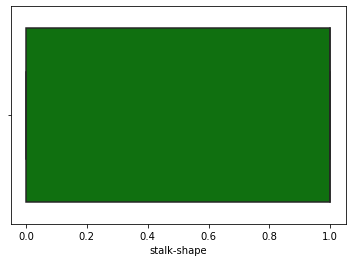

In [87]:
sn.boxplot(df["stalk-shape"], color='g')

<AxesSubplot:xlabel='stalk-root'>

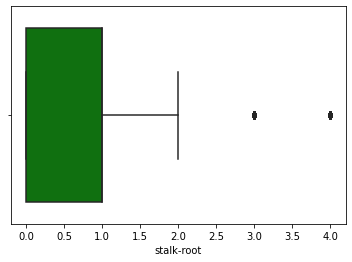

In [88]:
sn.boxplot(df["stalk-root"], color='g')

<AxesSubplot:xlabel='stalk-surface-above-ring'>

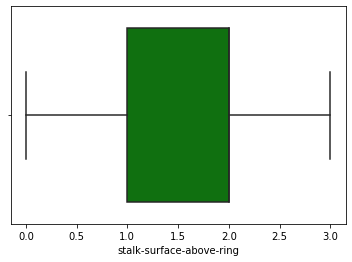

In [89]:
sn.boxplot(df["stalk-surface-above-ring"], color='g')

<AxesSubplot:xlabel='stalk-surface-below-ring'>

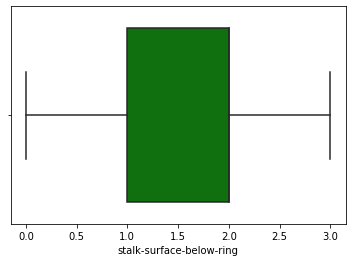

In [90]:
sn.boxplot(df["stalk-surface-below-ring"], color='g')

<AxesSubplot:xlabel='stalk-color-above-ring'>

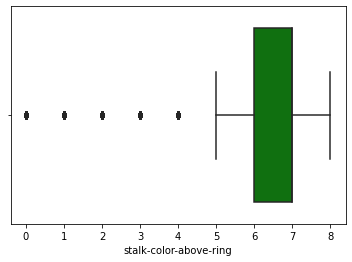

In [91]:
sn.boxplot(df["stalk-color-above-ring"], color='g')

<AxesSubplot:xlabel='stalk-color-below-ring'>

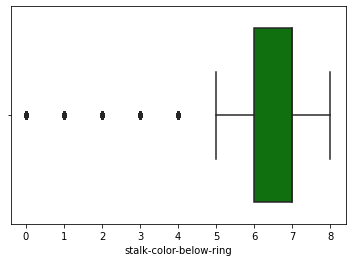

In [92]:
sn.boxplot(df["stalk-color-below-ring"], color='g')

<AxesSubplot:xlabel='veil-color'>

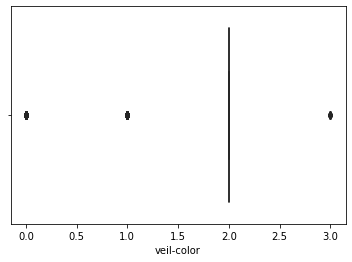

In [93]:
sn.boxplot(df["veil-color"], color='g')

<AxesSubplot:xlabel='ring-number'>

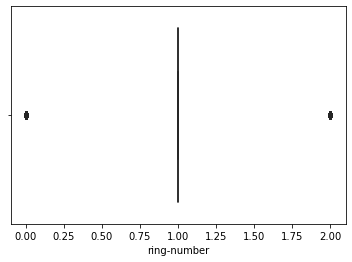

In [94]:
sn.boxplot(df["ring-number"], color='g')

<AxesSubplot:xlabel='ring-type'>

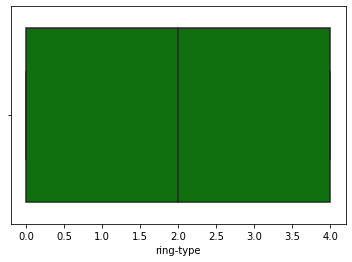

In [95]:
sn.boxplot(df["ring-type"], color='g')

<AxesSubplot:xlabel='spore-print-color'>

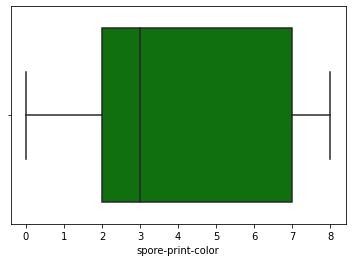

In [96]:
sn.boxplot(df["spore-print-color"], color='g')

<AxesSubplot:xlabel='population'>

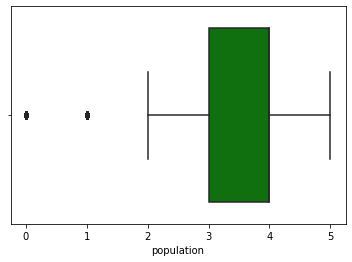

In [97]:
sn.boxplot(df["population"], color='g')

<AxesSubplot:xlabel='habitat'>

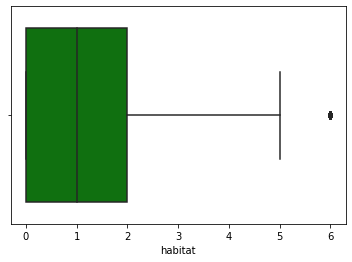

In [98]:
sn.boxplot(df["habitat"], color='g')

# Scatterplot

 Here we observe that cap-shape class 1-c has only poisonus ones and 4-b has only edible ones 


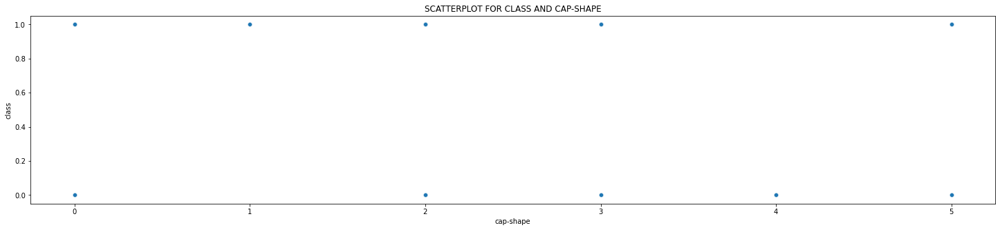

In [99]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND CAP-SHAPE')

sn.scatterplot(df['cap-shape'], df['class']);

print(" Here we observe that cap-shape class 1-c has only poisonus ones and 4-b has only edible ones ")

 Here we observe that cap-surface class 1-g has only poisonus ones


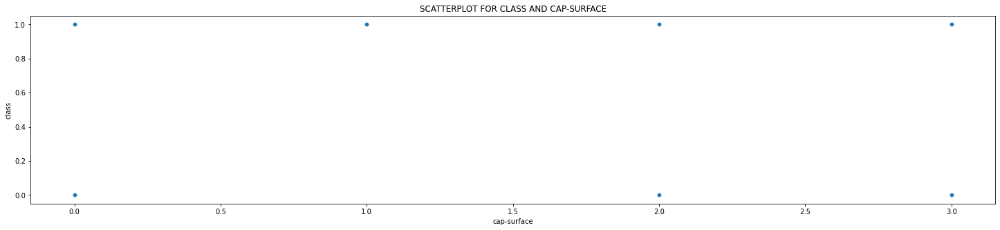

In [100]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND CAP-SURFACE')

sn.scatterplot(df['cap-surface'], df['class']);

print(" Here we observe that cap-surface class 1-g has only poisonus ones")

Here we observe that cap-color class 6-r has only edible ones


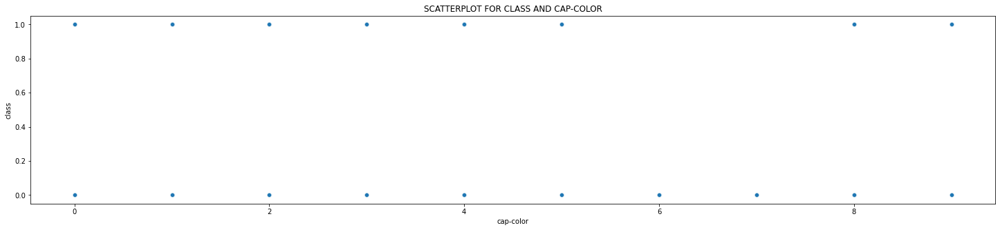

In [101]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND CAP-COLOR')

sn.scatterplot(df['cap-color'], df['class']);

print("Here we observe that cap-color class 6-r has only edible ones")

Here we observe that bruises both the classes has equal distribution of data


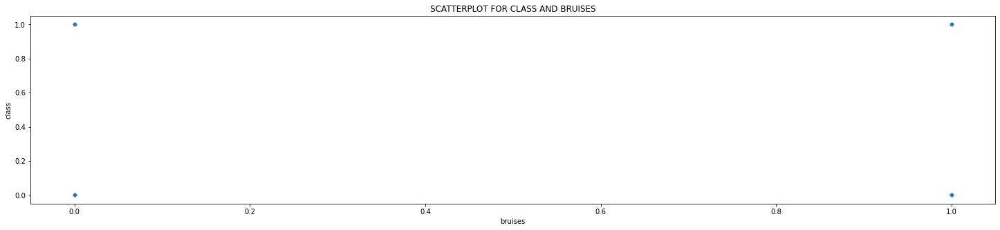

In [102]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND BRUISES')

sn.scatterplot(df['bruises'], df['class']);

print("Here we observe that bruises both the classes has equal distribution of data")

Here we observe that odor class 0-a, 3-l has edible ones and 1-c, 2-f, 4-m, 6-p, 7-s has poisonus ones


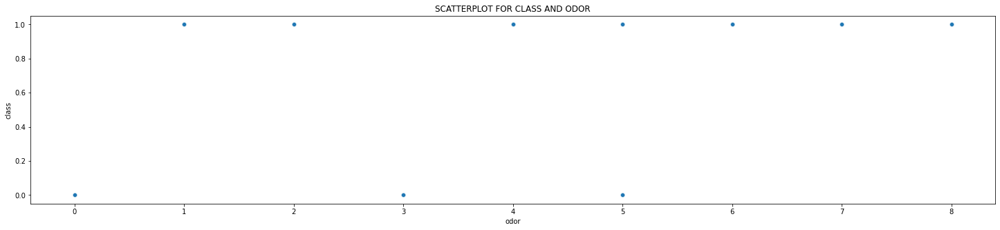

In [103]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND ODOR')

sn.scatterplot(df['odor'], df['class']);

print("Here we observe that odor class 0-a, 3-l has edible ones and 1-c, 2-f, 4-m, 6-p, 7-s has poisonus ones")

Here we observe that gill-attachment classes have equal distribution of data


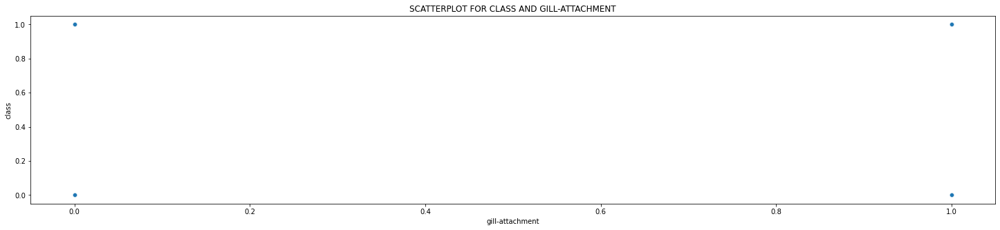

In [104]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND GILL-ATTACHMENT')

sn.scatterplot(df['gill-attachment'], df['class']);

print("Here we observe that gill-attachment classes have equal distribution of data")

Here we observe that gill-spacing classes have equal distribution of data


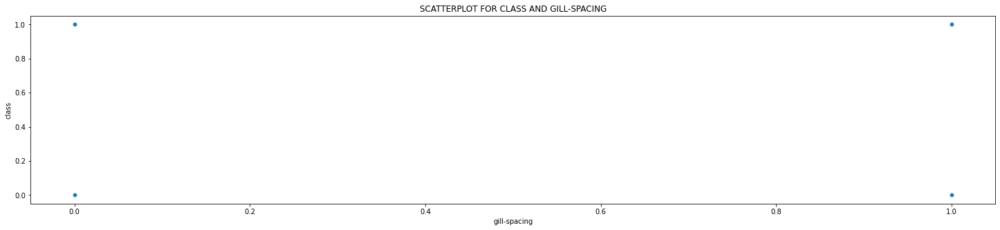

In [105]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND GILL-SPACING')

sn.scatterplot(df['gill-spacing'], df['class']);

print("Here we observe that gill-spacing classes have equal distribution of data")

Here we observe that gill-size classes have equal distribution of data


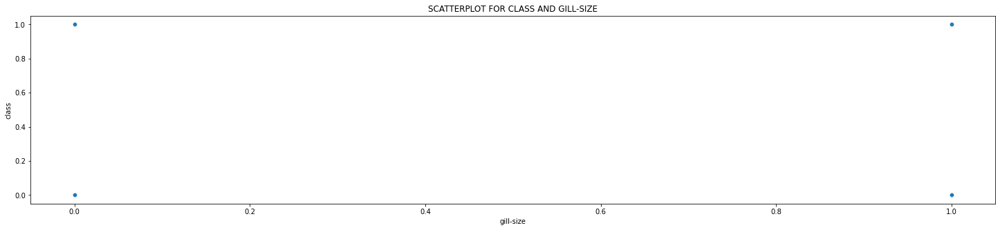

In [106]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND GILL-SIZE')

sn.scatterplot(df['gill-size'], df['class']);

print("Here we observe that gill-size classes have equal distribution of data")

Here we observe that gill-color classes 1-e,6-o has only edible ones 


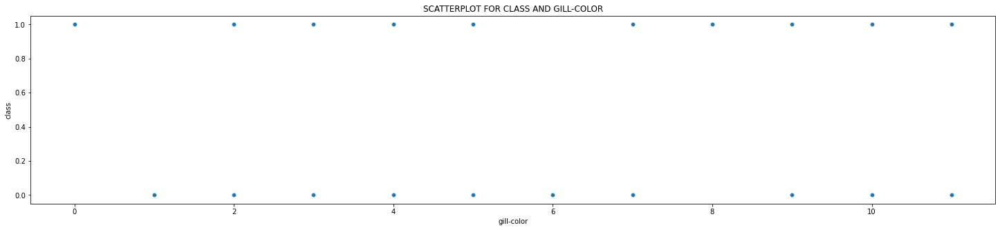

In [107]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND GILL-COLOR')

sn.scatterplot(df['gill-color'], df['class']);

print("Here we observe that gill-color classes 1-e,6-o has only edible ones ")

Here we observe that stalk-shape classes have equal distribution of data


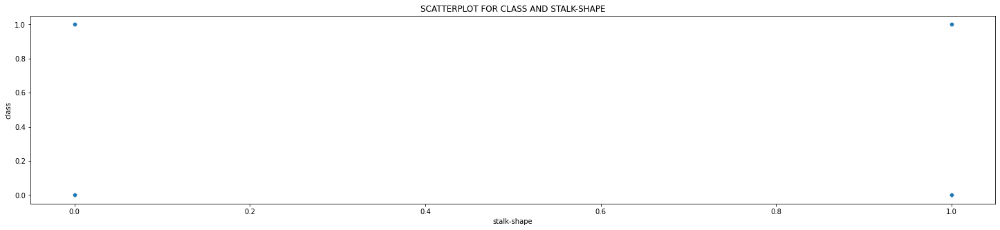

In [108]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND STALK-SHAPE')

sn.scatterplot(df['stalk-shape'], df['class']);

print("Here we observe that stalk-shape classes have equal distribution of data")

Here we observe that stalk-root class 4-r has only edible ones


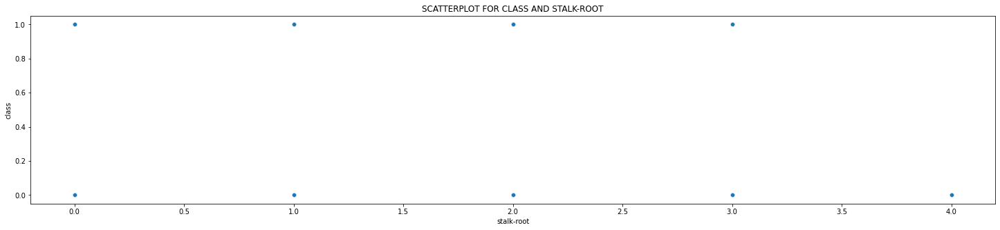

In [109]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND STALK-ROOT')

sn.scatterplot(df['stalk-root'], df['class']);

print("Here we observe that stalk-root class 4-r has only edible ones")

Here we observe that stalk-surface-above-ring classes has equal distribution of data


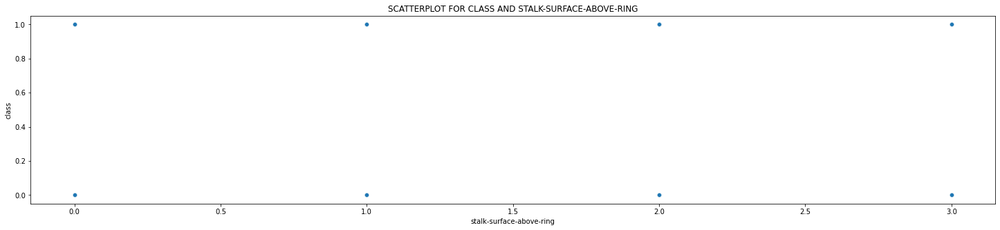

In [110]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND STALK-SURFACE-ABOVE-RING')

sn.scatterplot(df['stalk-surface-above-ring'], df['class']);

print("Here we observe that stalk-surface-above-ring classes has equal distribution of data")

Here we observe that stalk-surface-below-ring classes has equal distribution of data


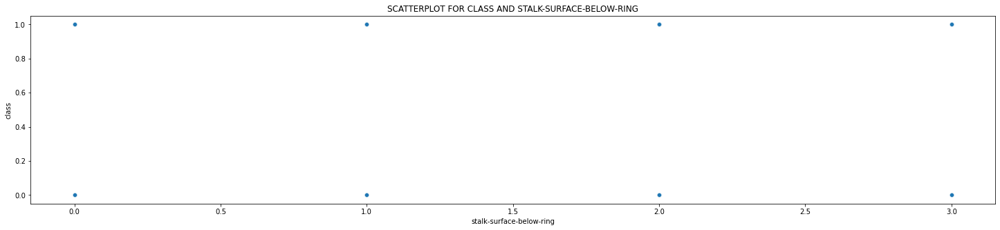

In [111]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND STALK-SURFACE-BELOW-RING')

sn.scatterplot(df['stalk-surface-below-ring'], df['class']);

print("Here we observe that stalk-surface-below-ring classes has equal distribution of data")

Here we observe that veil-color classes 0-n, 1-o has only edible ones


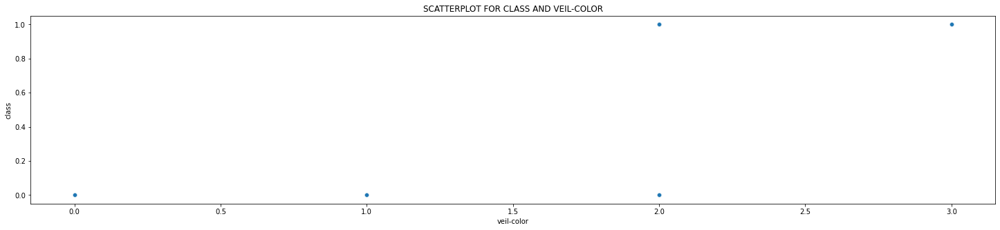

In [112]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND VEIL-COLOR')

sn.scatterplot(df['veil-color'], df['class']);

print("Here we observe that veil-color classes 0-n, 1-o has only edible ones")

Here we observe that ring-number class 0-n has only Posionus ones


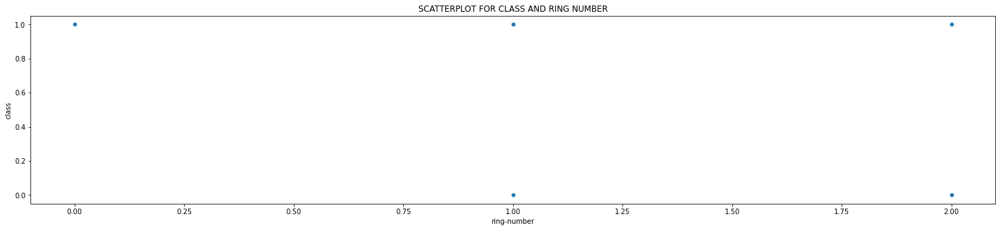

In [113]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND RING NUMBER')

sn.scatterplot(df['ring-number'], df['class']);

print("Here we observe that ring-number class 0-n has only Posionus ones")

Here we observe that ring-type classess 1-f has only edible ones and 2-l, 3-n has only poisonus ones.


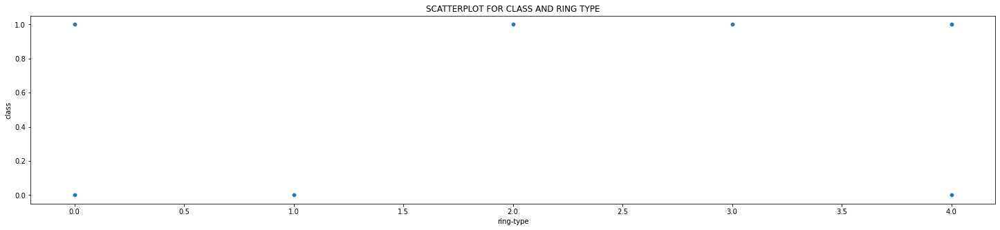

In [114]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND RING TYPE')

sn.scatterplot(df['ring-type'], df['class']);

print("Here we observe that ring-type classess 1-f has only edible ones and 2-l, 3-n has only poisonus ones.")

Here we observe that spore-print-color classess 0-b has only edible ones and 5-r, 6-u has only poisonus ones


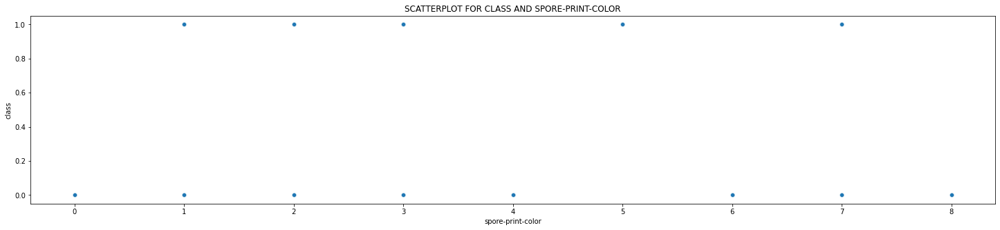

In [115]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND SPORE-PRINT-COLOR')

sn.scatterplot(df['spore-print-color'], df['class']);

print("Here we observe that spore-print-color classess 0-b has only edible ones and 5-r, 6-u has only poisonus ones")

Here we observe that population classess 0-a, 2-n has only edible ones


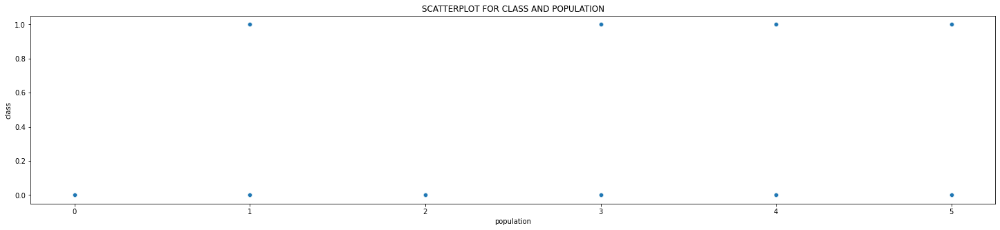

In [116]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND POPULATION')

sn.scatterplot(df['population'], df['class']);

print("Here we observe that population classess 0-a, 2-n has only edible ones")

Here we observe that habitat class 6-w has only edible ones


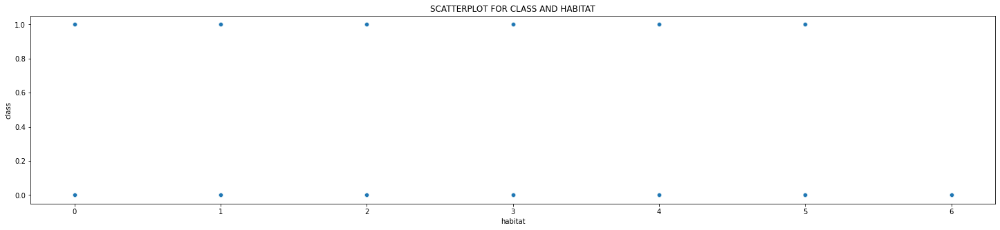

In [117]:
plt.figure(figsize=[25,5])

plt.title('SCATTERPLOT FOR CLASS AND HABITAT')

sn.scatterplot(df['habitat'], df['class']);

print("Here we observe that habitat class 6-w has only edible ones")

# Pairplot

Here we could observe that the gill-size column has the best distriution of edible and poisonus mushrooms


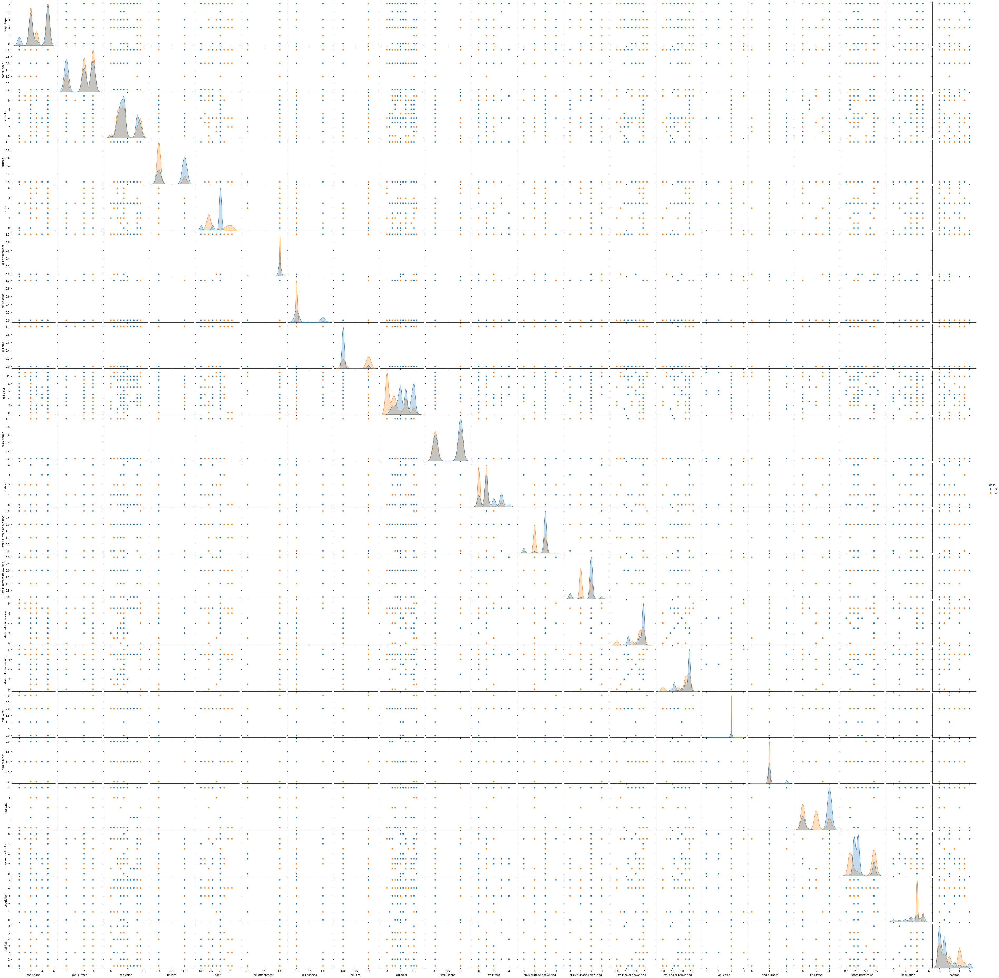

In [118]:
g = sn.pairplot(df, hue="class")
print("Here we could observe that the gill-size column has the best distriution of edible and poisonus mushrooms")

In [155]:
# To perform empty string check on Target variable

df['class'].isnull().head()

0    False
1    False
2    False
3    False
4    False
Name: class, dtype: bool

# Catplot

Here we see that Mushroom with class cap shape of 4 has only edible ones and 1 does not have any edible ones


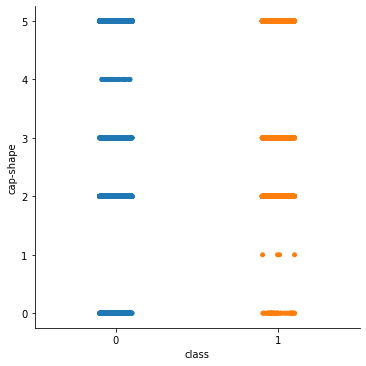

In [120]:
sn.catplot(x="class", y="cap-shape", data=df)
print("Here we see that Mushroom with class cap shape of 4 has only edible ones and 1 does not have any edible ones")

Here we see that Mushroom with cap surface class 1 has only poisonus ones


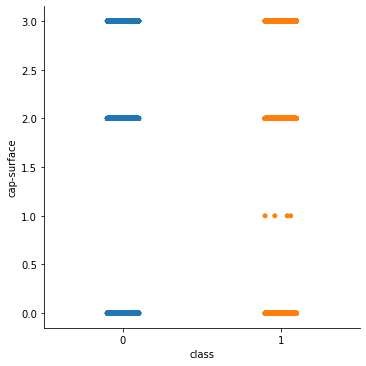

In [121]:
sn.catplot(x="class", y="cap-surface", data=df)
print("Here we see that Mushroom with cap surface class 1 has only poisonus ones")

Here we see that Mushroom with cap color class 6 has only edible mushrooms


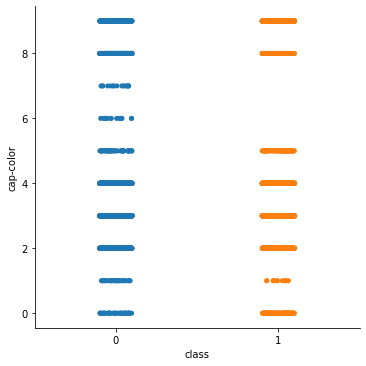

In [122]:
sn.catplot(x="class", y="cap-color", data=df)
print("Here we see that Mushroom with cap color class 6 has only edible mushrooms")

Here we see that Mushroom with bruises has an equal distribution


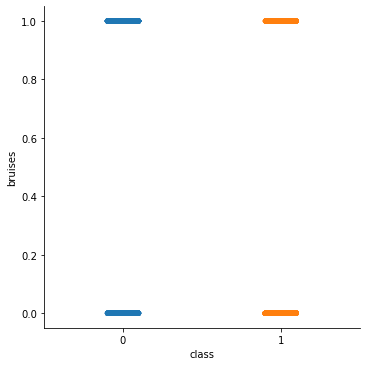

In [123]:
sn.catplot(x="class", y="bruises", data=df)
print("Here we see that Mushroom with bruises has an equal distribution")

Here we see that Mushroom with odor class 0 and 3 has only edible mushrooms


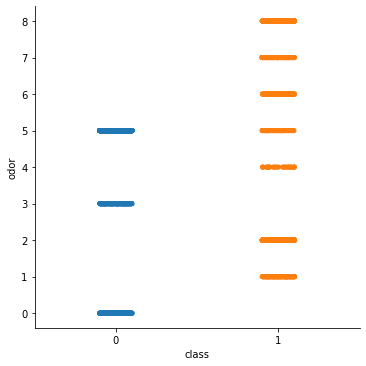

In [124]:
sn.catplot(x="class", y="odor", data=df)
print("Here we see that Mushroom with odor class 0 and 3 has only edible mushrooms")

Here we see that Mushroom with gill-attachment has an equal distribuion of edible and poisonus mushrooms


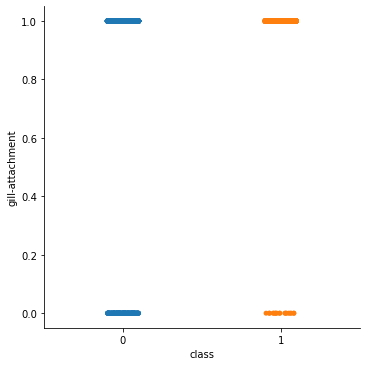

In [125]:
sn.catplot(x="class", y="gill-attachment", data=df)
print("Here we see that Mushroom with gill-attachment has an equal distribuion of edible and poisonus mushrooms")

Here we see that Mushroom with gill-spacing has equal distribution of edible and poisonus ones


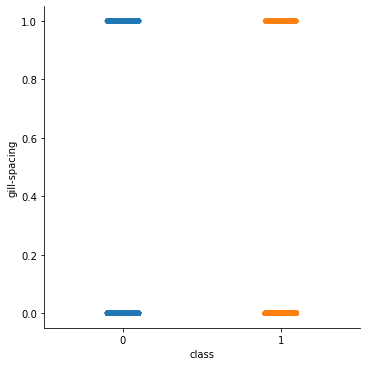

In [126]:
sn.catplot(x="class", y="gill-spacing", data=df)
print("Here we see that Mushroom with gill-spacing has equal distribution of edible and poisonus ones")

Here we see that Mushroom with gill-size has equal distribution of edible and poisonus ones


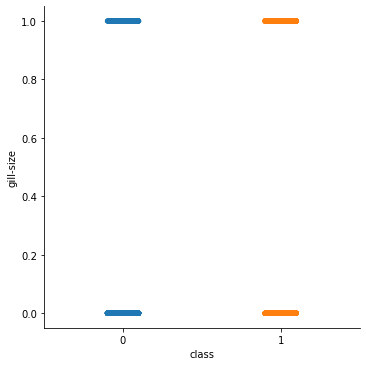

In [127]:
sn.catplot(x="class", y="gill-size", data=df)
print("Here we see that Mushroom with gill-size has equal distribution of edible and poisonus ones")

Here we see that Mushroom with gill color class 6 has only edible ones


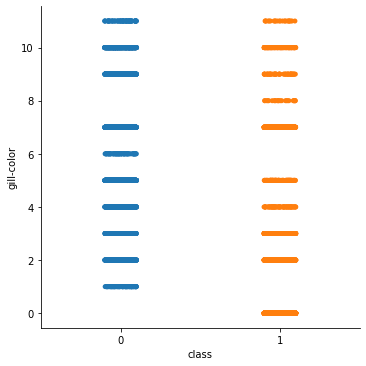

In [128]:
sn.catplot(x="class", y="gill-color", data=df)
print("Here we see that Mushroom with gill color class 6 has only edible ones")

Here we see that Mushroom with stalk shape has equal distribution of edible and poisonus ones


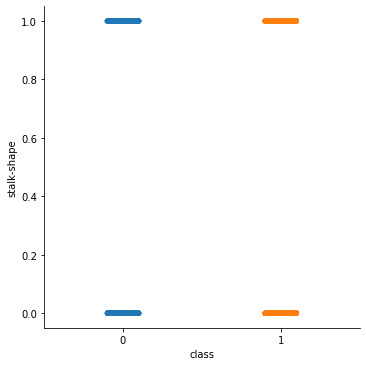

In [129]:
sn.catplot(x="class", y="stalk-shape", data=df)
print("Here we see that Mushroom with stalk shape has equal distribution of edible and poisonus ones")

Here we see that Mushroom with stalk root class 4 has only edible ones


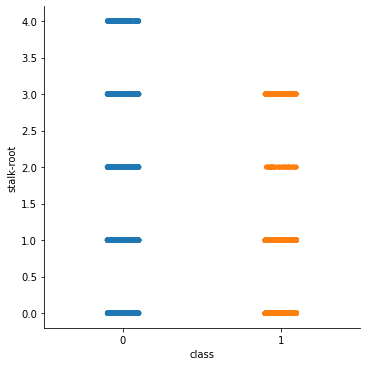

In [130]:
sn.catplot(x="class", y="stalk-root", data=df)
print("Here we see that Mushroom with stalk root class 4 has only edible ones")

Here we see that Mushroom with stalk-surface-above-ring has almost equal distribution of edible and poisonus ones 


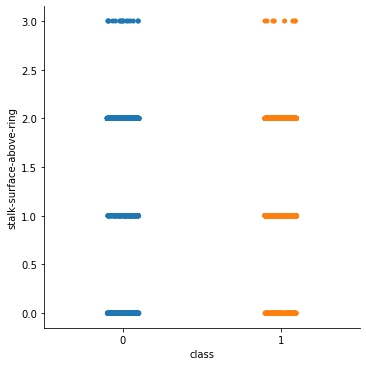

In [131]:
sn.catplot(x="class", y="stalk-surface-above-ring", data=df)
print("Here we see that Mushroom with stalk-surface-above-ring has almost equal distribution of edible and poisonus ones ")

Here we see that Mushroom with stalk-surface-below-ring also has almost equal distribution of data


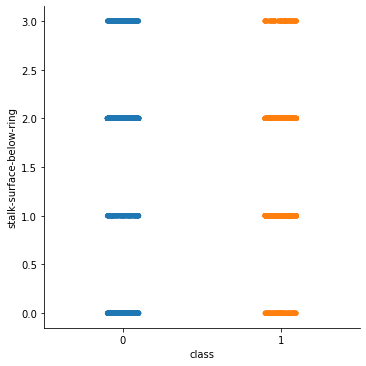

In [132]:
sn.catplot(x="class", y="stalk-surface-below-ring", data=df)
print("Here we see that Mushroom with stalk-surface-below-ring also has almost equal distribution of data")

Here we see that Mushroom with stalk-color-above-ring class 0 and 1 has only poisonus ones and class 2, 3, 5 has only edible ones


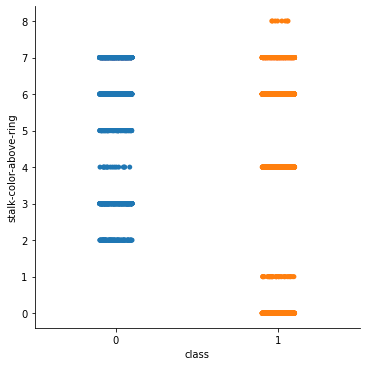

In [133]:
sn.catplot(x="class", y="stalk-color-above-ring", data=df)
print("Here we see that Mushroom with stalk-color-above-ring class 0 and 1 has only poisonus ones and class 2, 3, 5 has only edible ones")

Here we see that Mushroom with stalk-color-below-ring class 2 and 5 has only edible ones 


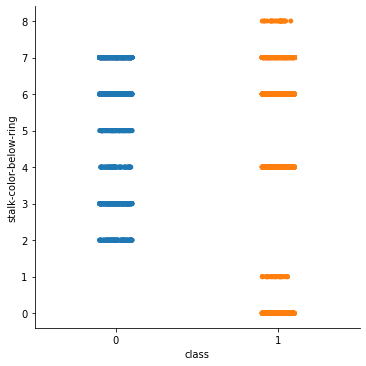

In [134]:
sn.catplot(x="class", y="stalk-color-below-ring", data=df)
print("Here we see that Mushroom with stalk-color-below-ring class 2 and 5 has only edible ones ")

Here we see that Mushroom with veil-color class 0 and 1 has only edible ones


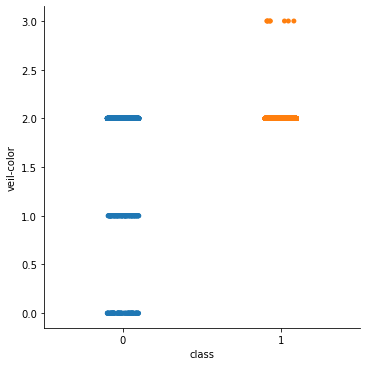

In [135]:
sn.catplot(x="class", y="veil-color", data=df)
print("Here we see that Mushroom with veil-color class 0 and 1 has only edible ones")

Here we see that Mushroom with ring-number class 0 has only poisonus ones 


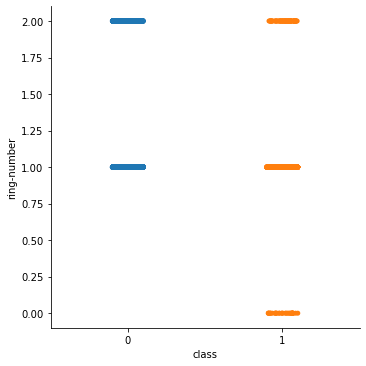

In [136]:
sn.catplot(x="class", y="ring-number", data=df)
print("Here we see that Mushroom with ring-number class 0 has only poisonus ones ")

Here we see that Mushroom with ring-type class 1 has only edible ones and class 2, 3 has only poisonus ones


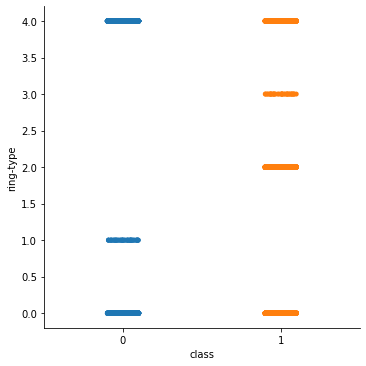

In [137]:
sn.catplot(x="class", y="ring-type", data=df)
print("Here we see that Mushroom with ring-type class 1 has only edible ones and class 2, 3 has only poisonus ones")

Here we see that Mushroom with spore-print-color class o, 4, 8 has only edible ones


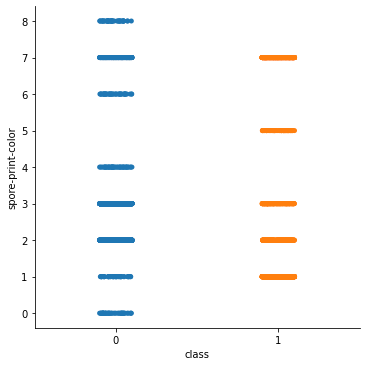

In [138]:
sn.catplot(x="class", y="spore-print-color", data=df)
print("Here we see that Mushroom with spore-print-color class o, 4, 8 has only edible ones")

Here we see that Mushroom with Population class 0 and 2 has only edible mushrooms


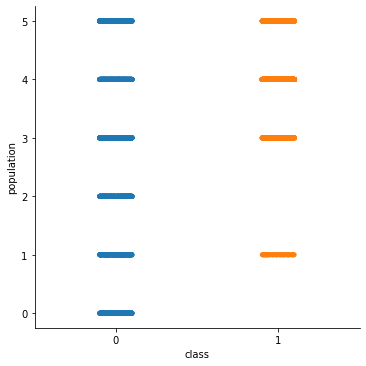

In [139]:
sn.catplot(x="class", y="population", data=df)
print("Here we see that Mushroom with Population class 0 and 2 has only edible mushrooms")

Here we see that Mushroom with habitat class 6 has only edible ones


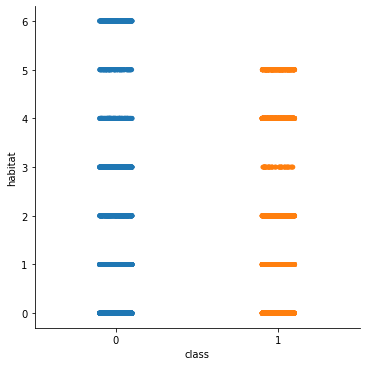

In [140]:
sn.catplot(x="class", y="habitat", data=df)
print("Here we see that Mushroom with habitat class 6 has only edible ones")

In [141]:
df.describe()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
count,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000,8124.000000
mean,0.482029,3.348104,1.827671,4.504677,0.415559,4.144756,0.974151,0.161497,0.309207,4.810684,0.567208,1.109798,1.575086,1.603644,5.816347,5.794682,1.965534,1.069424,2.291974,3.596750,3.644018,1.508616
std,0.499708,1.604329,1.229873,2.545821,0.492848,2.103729,0.158695,0.368011,0.462195,3.540359,0.495493,1.061106,0.621459,0.675974,1.901747,1.907291,0.242669,0.271064,1.801672,2.382663,1.252082,1.719975
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,0.000000,3.000000,0.000000,2.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,6.000000,6.000000,2.000000,1.000000,0.000000,2.000000,3.000000,0.000000
50%,0.000000,3.000000,2.000000,4.000000,0.000000,5.000000,1.000000,0.000000,0.000000,5.000000,1.000000,1.000000,2.000000,2.000000,7.000000,7.000000,2.000000,1.000000,2.000000,3.000000,4.000000,1.000000
75%,1.000000,5.000000,3.000000,8.000000,1.000000,5.000000,1.000000,0.000000,1.000000,7.000000,1.000000,1.000000,2.000000,2.000000,7.000000,7.000000,2.000000,1.000000,4.000000,7.000000,4.000000,2.000000
max,1.000000,5.000000,3.000000,9.000000,1.000000,8.000000,1.000000,1.000000,1.000000,11.000000,1.000000,4.000000,3.000000,3.000000,8.000000,8.000000,3.000000,2.000000,4.000000,8.000000,5.000000,6.000000


# Stats Heatmap

Here we observe that there is no signs of colinearity


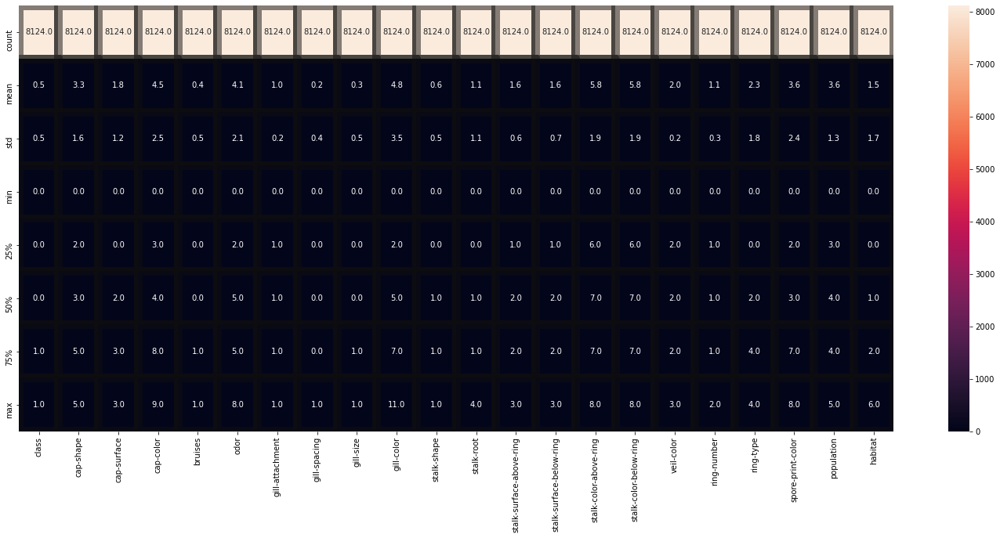

In [142]:
plt.figure(figsize=(25,10))
sn.heatmap(df.describe(), annot=True, linewidth=10, linecolor='#0f0f0f80', fmt='0.1f')
print("Here we observe that there is no signs of colinearity")

In [143]:
cor=df.corr()
cor

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-color,ring-number,ring-type,spore-print-color,population,habitat
class,1.000000,0.052951,0.178446,-0.031384,-0.501530,-0.093552,0.129200,-0.348387,0.540024,-0.530566,-0.102019,-0.379361,-0.334593,-0.298801,-0.154003,-0.146730,0.145142,-0.214366,-0.411771,0.171961,0.298686,0.217179
cap-shape,0.052951,1.000000,-0.050454,-0.048203,-0.035374,-0.021935,0.078865,0.013196,0.054050,-0.006039,0.063794,0.030191,-0.030417,-0.032591,-0.031659,-0.030390,0.072560,-0.106534,-0.025457,-0.073416,0.063413,-0.042221
cap-surface,0.178446,-0.050454,1.000000,-0.019402,0.070228,0.045233,-0.034180,-0.282306,0.208100,-0.161017,-0.014123,-0.126245,0.089090,0.107965,0.066050,0.068885,-0.016603,-0.026147,-0.106407,0.230364,0.021555,0.163887
cap-color,-0.031384,-0.048203,-0.019402,1.000000,-0.000764,-0.387121,0.041436,0.144259,-0.169464,0.084659,-0.456496,0.321274,-0.060837,-0.047710,0.002364,0.008057,0.036130,-0.005822,0.162513,-0.293523,-0.144770,0.033925
bruises,-0.501530,-0.035374,0.070228,-0.000764,1.000000,-0.061825,0.137359,-0.299473,-0.369596,0.527120,0.099364,0.244188,0.460824,0.458983,0.083538,0.092874,0.119770,0.056788,0.692973,-0.285008,0.088137,-0.075095
odor,-0.093552,-0.021935,0.045233,-0.387121,-0.061825,1.000000,-0.059590,0.063936,0.310495,-0.129213,0.459766,-0.205215,0.118617,0.061820,0.174532,0.169407,-0.057747,0.111905,-0.281387,0.469055,-0.043623,-0.026610
gill-attachment,0.129200,0.078865,-0.034180,0.041436,0.137359,-0.059590,1.000000,0.071489,0.108984,-0.128567,0.186485,0.144063,-0.088916,-0.116177,0.099299,0.097160,0.897518,0.093236,-0.146689,-0.029524,0.165575,-0.030304
gill-spacing,-0.348387,0.013196,-0.282306,0.144259,-0.299473,0.063936,0.071489,1.000000,-0.108333,0.100193,0.080895,0.350548,-0.212359,-0.213775,0.274574,0.253505,0.073363,0.243014,-0.195897,0.047323,-0.529253,-0.154680
gill-size,0.540024,0.054050,0.208100,-0.169464,-0.369596,0.310495,0.108984,-0.108333,1.000000,-0.516736,0.214576,-0.344345,0.056310,0.010894,0.296548,0.278708,0.103809,-0.171362,-0.460872,0.622991,0.147682,0.161418
gill-color,-0.530566,-0.006039,-0.161017,0.084659,0.527120,-0.129213,-0.128567,0.100193,-0.516736,1.000000,-0.175699,0.315080,0.224287,0.257224,-0.058299,-0.074781,-0.097583,0.096054,0.629398,-0.416135,-0.034090,-0.202972


# Correlation Heatmap

Here in the Correlation heatmap we observe that the Correlation with Class is strongest with Population and weakest with ring-type


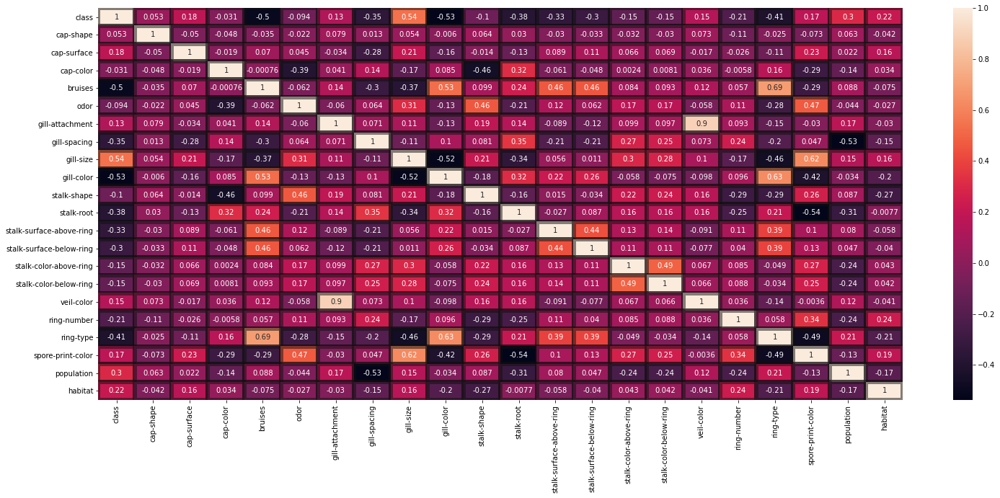

In [144]:
plt.figure(figsize=(25,10))
sn.heatmap(cor, annot=True, linewidth=5, linecolor='#0f0f0f80')
print("Here in the Correlation heatmap we observe that the Correlation with Class is strongest with Population and weakest with ring-type")

# To check the columns +ve and -ve correlated

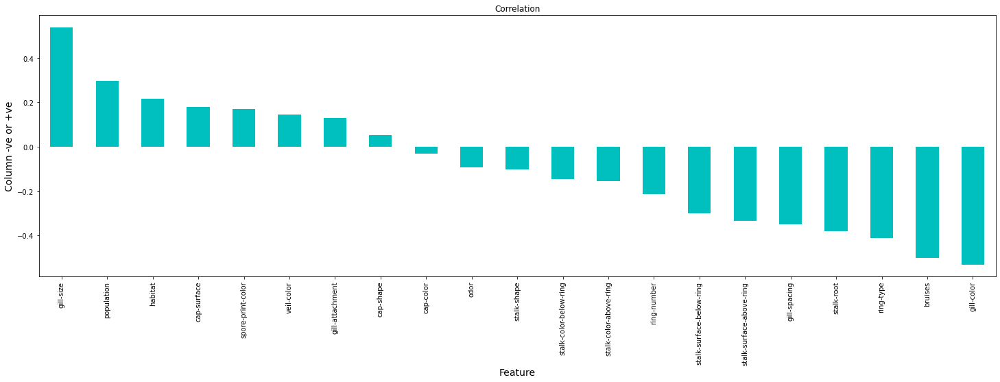

Here we observe that columns ['gill-size, population, habitat, cap-surface, veil-color, gill-attachment, cap-shape,'] are all +vely correlated and columns ['odor, stalk-shape, stalk-color below ring, stalk-color above ring, ring number, stalk-surface below ring, gill-spacing, stalk-root, ring-type, bruises, gill-color, veil-shape'] are all -vely correlated


In [145]:
plt.figure(figsize=(25,7))
df.corr()['class'].sort_values(ascending=False).drop(['class']).plot(kind='bar', color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column -ve or +ve', fontsize=14)
plt.title('Correlation', fontsize=12)
plt.show()
print("Here we observe that columns ['gill-size, population, habitat, cap-surface, veil-color, gill-attachment, cap-shape,'] are all +vely correlated and columns ['odor, stalk-shape, stalk-color below ring, stalk-color above ring, ring number, stalk-surface below ring, gill-spacing, stalk-root, ring-type, bruises, gill-color, veil-shape'] are all -vely correlated")

In [146]:
df.skew()

class                       0.071946
cap-shape                  -0.247052
cap-surface                -0.590859
cap-color                   0.706965
bruises                     0.342750
odor                       -0.080790
gill-attachment            -5.977076
gill-spacing                1.840088
gill-size                   0.825797
gill-color                  0.061410
stalk-shape                -0.271345
stalk-root                  0.947852
stalk-surface-above-ring   -1.098739
stalk-surface-below-ring   -0.757703
stalk-color-above-ring     -1.835434
stalk-color-below-ring     -1.791593
veil-color                 -6.946944
ring-number                 2.701657
ring-type                  -0.290018
spore-print-color           0.548426
population                 -1.413096
habitat                     0.985548
dtype: float64

* Since our Skewness limit is btw +0.5 to -0.5 and skewness analysis shows 0.071946 on Target column ['class'] No need to perform a Skewness removal

# Outlier Removal is not required since all are categorical columns

# Separating the Features columns and Target Column:

In [268]:
features=df.drop("class",axis=1)
target=df["class"]

# Classification Test Model 1

In [269]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()

In [270]:
for i in range(0,500):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    LR.fit(features_train, target_train)
    pred_train=LR.predict(features_train)
    pred_test=LR.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.9514196619071065
At random state 0,the testing accuracy is: 0.9502708025603152


At random state 1,the training accuracy is: 0.9505990480879698
At random state 1,the testing accuracy is: 0.9537173806006893


At random state 2,the training accuracy is: 0.9542097488921714
At random state 2,the testing accuracy is: 0.9537173806006893


At random state 3,the training accuracy is: 0.9509272936156244
At random state 3,the testing accuracy is: 0.948301329394387


At random state 4,the training accuracy is: 0.9520761529624159
At random state 4,the testing accuracy is: 0.947316592811423


At random state 5,the training accuracy is: 0.9479730838667323
At random state 5,the testing accuracy is: 0.946824224519941


At random state 6,the training accuracy is: 0.9486295749220417
At random state 6,the testing accuracy is: 0.9433776464795667


At random state 7,the training accuracy is: 0.9476448383390776
At random state 7,the testing accuracy is: 0.954702

At random state 64,the training accuracy is: 0.9484654521582143
At random state 64,the testing accuracy is: 0.947316592811423


At random state 65,the training accuracy is: 0.9522402757262433
At random state 65,the testing accuracy is: 0.9566715903495815


At random state 66,the training accuracy is: 0.9532250123092072
At random state 66,the testing accuracy is: 0.9404234367306745


At random state 67,the training accuracy is: 0.954537994419826
At random state 67,the testing accuracy is: 0.9419005416051206


At random state 68,the training accuracy is: 0.9515837846709339
At random state 68,the testing accuracy is: 0.946824224519941


At random state 69,the training accuracy is: 0.9551944854751354
At random state 69,the testing accuracy is: 0.9458394879369768


At random state 70,the training accuracy is: 0.9507631708517972
At random state 70,the testing accuracy is: 0.947808961102905


At random state 71,the training accuracy is: 0.9512555391432792
At random state 71,the testing accura

At random state 128,the training accuracy is: 0.9494501887411784
At random state 128,the testing accuracy is: 0.9551944854751354


At random state 129,the training accuracy is: 0.9530608895453799
At random state 129,the testing accuracy is: 0.9443623830625307


At random state 130,the training accuracy is: 0.9504349253241424
At random state 130,the testing accuracy is: 0.9537173806006893


At random state 131,the training accuracy is: 0.9519120301985885
At random state 131,the testing accuracy is: 0.9556868537666174


At random state 132,the training accuracy is: 0.9519120301985885
At random state 132,the testing accuracy is: 0.9532250123092072


At random state 133,the training accuracy is: 0.9556868537666174
At random state 133,the testing accuracy is: 0.949286065977351


At random state 134,the training accuracy is: 0.9547021171836534
At random state 134,the testing accuracy is: 0.9512555391432792


At random state 135,the training accuracy is: 0.947316592811423
At random state 135,

At random state 192,the training accuracy is: 0.953553257836862
At random state 192,the testing accuracy is: 0.9522402757262433


At random state 193,the training accuracy is: 0.9525685212538979
At random state 193,the testing accuracy is: 0.9497784342688331


At random state 194,the training accuracy is: 0.9509272936156244
At random state 194,the testing accuracy is: 0.9556868537666174


At random state 195,the training accuracy is: 0.947808961102905
At random state 195,the testing accuracy is: 0.9556868537666174


At random state 196,the training accuracy is: 0.9538815033645166
At random state 196,the testing accuracy is: 0.9527326440177253


At random state 197,the training accuracy is: 0.9520761529624159
At random state 197,the testing accuracy is: 0.9551944854751354


At random state 198,the training accuracy is: 0.9494501887411784
At random state 198,the testing accuracy is: 0.9497784342688331


At random state 199,the training accuracy is: 0.9501066797964878
At random state 199,

At random state 256,the testing accuracy is: 0.9551944854751354


At random state 257,the training accuracy is: 0.9514196619071065
At random state 257,the testing accuracy is: 0.9507631708517972


At random state 258,the training accuracy is: 0.9522402757262433
At random state 258,the testing accuracy is: 0.9507631708517972


At random state 259,the training accuracy is: 0.9543738716559986
At random state 259,the testing accuracy is: 0.9502708025603152


At random state 260,the training accuracy is: 0.9510914163794518
At random state 260,the testing accuracy is: 0.9611029049729197


At random state 261,the training accuracy is: 0.9530608895453799
At random state 261,the testing accuracy is: 0.947808961102905


At random state 262,the training accuracy is: 0.954537994419826
At random state 262,the testing accuracy is: 0.9556868537666174


At random state 263,the training accuracy is: 0.9484654521582143
At random state 263,the testing accuracy is: 0.9522402757262433


At random state 264

At random state 322,the training accuracy is: 0.9507631708517972
At random state 322,the testing accuracy is: 0.9453471196454948


At random state 323,the training accuracy is: 0.953553257836862
At random state 323,the testing accuracy is: 0.9537173806006893


At random state 324,the training accuracy is: 0.9455112424093222
At random state 324,the testing accuracy is: 0.9512555391432792


At random state 325,the training accuracy is: 0.953553257836862
At random state 325,the testing accuracy is: 0.9487936976858691


At random state 326,the training accuracy is: 0.9479730838667323
At random state 326,the testing accuracy is: 0.9458394879369768


At random state 327,the training accuracy is: 0.9519120301985885
At random state 327,the testing accuracy is: 0.9463318562284588


At random state 328,the training accuracy is: 0.9512555391432792
At random state 328,the testing accuracy is: 0.9537173806006893


At random state 329,the training accuracy is: 0.9525685212538979
At random state 329,

At random state 385,the testing accuracy is: 0.9502708025603152


At random state 386,the training accuracy is: 0.9538815033645166
At random state 386,the testing accuracy is: 0.9497784342688331


At random state 387,the training accuracy is: 0.9512555391432792
At random state 387,the testing accuracy is: 0.9542097488921714


At random state 388,the training accuracy is: 0.9515837846709339
At random state 388,the testing accuracy is: 0.9547021171836534


At random state 389,the training accuracy is: 0.949286065977351
At random state 389,the testing accuracy is: 0.9507631708517972


At random state 390,the training accuracy is: 0.9517479074347612
At random state 390,the testing accuracy is: 0.9512555391432792


At random state 391,the training accuracy is: 0.954045626128344
At random state 391,the testing accuracy is: 0.9448547513540128


At random state 392,the training accuracy is: 0.9542097488921714
At random state 392,the testing accuracy is: 0.9453471196454948


At random state 393

At random state 449,the training accuracy is: 0.9514196619071065
At random state 449,the testing accuracy is: 0.9487936976858691


At random state 450,the training accuracy is: 0.9566715903495815
At random state 450,the testing accuracy is: 0.9433776464795667


At random state 451,the training accuracy is: 0.9502708025603152
At random state 451,the testing accuracy is: 0.9507631708517972


At random state 452,the training accuracy is: 0.9510914163794518
At random state 452,the testing accuracy is: 0.9512555391432792


At random state 453,the training accuracy is: 0.9509272936156244
At random state 453,the testing accuracy is: 0.9512555391432792


At random state 454,the training accuracy is: 0.9499425570326604
At random state 454,the testing accuracy is: 0.9497784342688331


At random state 455,the training accuracy is: 0.9566715903495815
At random state 455,the testing accuracy is: 0.9512555391432792


At random state 456,the training accuracy is: 0.9551944854751354
At random state 45

In [271]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=10)

In [272]:
LR.fit(features_train, target_train)

LogisticRegression()

In [273]:
pred_test=LR.predict(features_test)

In [274]:
print("Here we observe that we get : 95% accuracy for this model")
accuracy_score(target_test, pred_test)

Here we observe that we get : 95% accuracy for this model


0.9512555391432792

In [275]:
print("Here we see that f1 score is giving : 98% compared to the 95% accuracy score")
f1_score(target_test, pred_test, average='micro')

Here we see that f1 score is giving : 98% compared to the 95% accuracy score


0.9512555391432792

In [276]:
print(confusion_matrix(target_test, pred_test))
print(classification_report(target_test, pred_test))

[[1026   46]
 [  53  906]]
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      1072
           1       0.95      0.94      0.95       959

    accuracy                           0.95      2031
   macro avg       0.95      0.95      0.95      2031
weighted avg       0.95      0.95      0.95      2031



# Cross-Validation the Model 1

In [277]:
from sklearn.model_selection import cross_val_score

In [278]:
lin_score = cross_val_score(LR,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.36984615, 0.016     , 0.12430769, 0.00184615, 0.28633005])

In [279]:
print("Here we find the mean_score is at : 0.15% which is good for our model")
np.mean(lin_score_n)

Here we find the mean_score is at : 0.15% which is good for our model


0.15966600985221674

# Classification Test Model 2

In [318]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
SVC=SVC()

In [319]:
for i in range(0,500):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    SVC.fit(features_train, target_train)
    pred_train=SVC.predict(features_train)
    pred_test=SVC.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.9909732479894962
At random state 0,the testing accuracy is: 0.9916297390448056


At random state 1,the training accuracy is: 0.9908091252256688
At random state 1,the testing accuracy is: 0.9867060561299852


At random state 2,the training accuracy is: 0.9906450024618415
At random state 2,the testing accuracy is: 0.9896602658788775


At random state 3,the training accuracy is: 0.9914656162809782
At random state 3,the testing accuracy is: 0.9896602658788775


At random state 4,the training accuracy is: 0.9921221073362876
At random state 4,the testing accuracy is: 0.9867060561299852


At random state 5,the training accuracy is: 0.9909732479894962
At random state 5,the testing accuracy is: 0.9896602658788775


At random state 6,the training accuracy is: 0.9904808796980141
At random state 6,the testing accuracy is: 0.9921221073362876


At random state 7,the training accuracy is: 0.9908091252256688
At random state 7,the testing accuracy is: 0.991

At random state 64,the training accuracy is: 0.9906450024618415
At random state 64,the testing accuracy is: 0.9921221073362876


At random state 65,the training accuracy is: 0.9913014935171508
At random state 65,the testing accuracy is: 0.9901526341703595


At random state 66,the training accuracy is: 0.9911373707533235
At random state 66,the testing accuracy is: 0.9881831610044313


At random state 67,the training accuracy is: 0.9899885114065321
At random state 67,the testing accuracy is: 0.9871984244214672


At random state 68,the training accuracy is: 0.9898243886427047
At random state 68,the testing accuracy is: 0.9891678975873953


At random state 69,the training accuracy is: 0.9919579845724602
At random state 69,the testing accuracy is: 0.9867060561299852


At random state 70,the training accuracy is: 0.9909732479894962
At random state 70,the testing accuracy is: 0.9881831610044313


At random state 71,the training accuracy is: 0.9903167569341867
At random state 71,the testing ac

At random state 128,the training accuracy is: 0.9911373707533235
At random state 128,the testing accuracy is: 0.9916297390448056


At random state 129,the training accuracy is: 0.9909732479894962
At random state 129,the testing accuracy is: 0.9906450024618415


At random state 130,the training accuracy is: 0.9913014935171508
At random state 130,the testing accuracy is: 0.9891678975873953


At random state 131,the training accuracy is: 0.9916297390448056
At random state 131,the testing accuracy is: 0.9891678975873953


At random state 132,the training accuracy is: 0.9908091252256688
At random state 132,the testing accuracy is: 0.9891678975873953


At random state 133,the training accuracy is: 0.9908091252256688
At random state 133,the testing accuracy is: 0.9896602658788775


At random state 134,the training accuracy is: 0.9904808796980141
At random state 134,the testing accuracy is: 0.9886755292959133


At random state 135,the training accuracy is: 0.9899885114065321
At random state 13

At random state 191,the training accuracy is: 0.9904808796980141
At random state 191,the testing accuracy is: 0.9871984244214672


At random state 192,the training accuracy is: 0.9911373707533235
At random state 192,the testing accuracy is: 0.9867060561299852


At random state 193,the training accuracy is: 0.9913014935171508
At random state 193,the testing accuracy is: 0.9926144756277696


At random state 194,the training accuracy is: 0.9911373707533235
At random state 194,the testing accuracy is: 0.9857213195470211


At random state 195,the training accuracy is: 0.9909732479894962
At random state 195,the testing accuracy is: 0.9906450024618415


At random state 196,the training accuracy is: 0.9903167569341867
At random state 196,the testing accuracy is: 0.9926144756277696


At random state 197,the training accuracy is: 0.9899885114065321
At random state 197,the testing accuracy is: 0.9911373707533235


At random state 198,the training accuracy is: 0.9886755292959133
At random state 19

At random state 254,the training accuracy is: 0.9906450024618415
At random state 254,the testing accuracy is: 0.9891678975873953


At random state 255,the training accuracy is: 0.9906450024618415
At random state 255,the testing accuracy is: 0.9867060561299852


At random state 256,the training accuracy is: 0.9911373707533235
At random state 256,the testing accuracy is: 0.9926144756277696


At random state 257,the training accuracy is: 0.9913014935171508
At random state 257,the testing accuracy is: 0.9896602658788775


At random state 258,the training accuracy is: 0.9917938618086328
At random state 258,the testing accuracy is: 0.9876907927129492


At random state 259,the training accuracy is: 0.9913014935171508
At random state 259,the testing accuracy is: 0.9896602658788775


At random state 260,the training accuracy is: 0.9914656162809782
At random state 260,the testing accuracy is: 0.9901526341703595


At random state 261,the training accuracy is: 0.9911373707533235
At random state 26

At random state 317,the training accuracy is: 0.9909732479894962
At random state 317,the testing accuracy is: 0.9891678975873953


At random state 318,the training accuracy is: 0.9909732479894962
At random state 318,the testing accuracy is: 0.9916297390448056


At random state 319,the training accuracy is: 0.9911373707533235
At random state 319,the testing accuracy is: 0.9891678975873953


At random state 320,the training accuracy is: 0.9909732479894962
At random state 320,the testing accuracy is: 0.9896602658788775


At random state 321,the training accuracy is: 0.9913014935171508
At random state 321,the testing accuracy is: 0.9911373707533235


At random state 322,the training accuracy is: 0.9904808796980141
At random state 322,the testing accuracy is: 0.9926144756277696


At random state 323,the training accuracy is: 0.9899885114065321
At random state 323,the testing accuracy is: 0.9921221073362876


At random state 324,the training accuracy is: 0.9919579845724602
At random state 32

At random state 380,the training accuracy is: 0.9909732479894962
At random state 380,the testing accuracy is: 0.9891678975873953


At random state 381,the training accuracy is: 0.9903167569341867
At random state 381,the testing accuracy is: 0.9871984244214672


At random state 382,the training accuracy is: 0.9911373707533235
At random state 382,the testing accuracy is: 0.9886755292959133


At random state 383,the training accuracy is: 0.9903167569341867
At random state 383,the testing accuracy is: 0.9911373707533235


At random state 384,the training accuracy is: 0.9906450024618415
At random state 384,the testing accuracy is: 0.9906450024618415


At random state 385,the training accuracy is: 0.9914656162809782
At random state 385,the testing accuracy is: 0.9891678975873953


At random state 386,the training accuracy is: 0.9911373707533235
At random state 386,the testing accuracy is: 0.9842442146725751


At random state 387,the training accuracy is: 0.9909732479894962
At random state 38

At random state 443,the training accuracy is: 0.9917938618086328
At random state 443,the testing accuracy is: 0.9926144756277696


At random state 444,the training accuracy is: 0.9909732479894962
At random state 444,the testing accuracy is: 0.9891678975873953


At random state 445,the training accuracy is: 0.9903167569341867
At random state 445,the testing accuracy is: 0.9901526341703595


At random state 446,the training accuracy is: 0.9914656162809782
At random state 446,the testing accuracy is: 0.9891678975873953


At random state 447,the training accuracy is: 0.9916297390448056
At random state 447,the testing accuracy is: 0.9926144756277696


At random state 448,the training accuracy is: 0.9899885114065321
At random state 448,the testing accuracy is: 0.9881831610044313


At random state 449,the training accuracy is: 0.9896602658788775
At random state 449,the testing accuracy is: 0.9891678975873953


At random state 450,the training accuracy is: 0.9901526341703595
At random state 45

In [320]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=10)

In [283]:
SVC.fit(features_train, target_train)

SVC()

In [284]:
pred_test=SVC.predict(features_test)

In [285]:
print("Here we observe that we get : 99% accuracy for this model")
accuracy_score(target_test, pred_test)

Here we observe that we get : 99% accuracy for this model


0.9916297390448056

In [286]:
print("Here we confirm that this model gives : 99% accuracy assuming average as micro argument on random state 10 ")
f1_score(target_test, pred_test, average='micro')

Here we confirm that this model gives : 99% accuracy assuming average as micro argument on random state 10 


0.9916297390448056

In [287]:
print(confusion_matrix(target_test, pred_test))
print(classification_report(target_test, pred_test))

[[1069    3]
 [  14  945]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1072
           1       1.00      0.99      0.99       959

    accuracy                           0.99      2031
   macro avg       0.99      0.99      0.99      2031
weighted avg       0.99      0.99      0.99      2031



# Cross-Validation the Model 2

In [288]:
from sklearn.model_selection import cross_val_score

In [289]:
lin_score = cross_val_score(SVC,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.184     , 0.00430769, 0.10092308, 0.        , 0.50061576])

In [290]:
print("Here we find the mean_score is at : 0.15% which is good for our model")
np.mean(lin_score_n)

Here we find the mean_score is at : 0.15% which is good for our model


0.15796930655551344

# Classification Test Model 3

In [291]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier

DTC=SGDClassifier()

In [292]:
for i in range(0,500):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    DTC.fit(features_train, target_train)
    pred_train=DTC.predict(features_train)
    pred_test=DTC.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.9505990480879698
At random state 0,the testing accuracy is: 0.9487936976858691


At random state 1,the training accuracy is: 0.9317249302478253
At random state 1,the testing accuracy is: 0.9330379123584442


At random state 2,the training accuracy is: 0.9615952732644018
At random state 2,the testing accuracy is: 0.9630723781388478


At random state 3,the training accuracy is: 0.9547021171836534
At random state 3,the testing accuracy is: 0.9512555391432792


At random state 4,the training accuracy is: 0.9515837846709339
At random state 4,the testing accuracy is: 0.9547021171836534


At random state 5,the training accuracy is: 0.9514196619071065
At random state 5,the testing accuracy is: 0.9517479074347612


At random state 6,the training accuracy is: 0.9533891350730346
At random state 6,the testing accuracy is: 0.9537173806006893


At random state 7,the training accuracy is: 0.9474807155752503
At random state 7,the testing accuracy is: 0.950

At random state 66,the training accuracy is: 0.9612670277367471
At random state 66,the testing accuracy is: 0.9507631708517972


At random state 67,the training accuracy is: 0.9486295749220417
At random state 67,the testing accuracy is: 0.9423929098966027


At random state 68,the training accuracy is: 0.9532250123092072
At random state 68,the testing accuracy is: 0.9433776464795667


At random state 69,the training accuracy is: 0.9558509765304449
At random state 69,the testing accuracy is: 0.9497784342688331


At random state 70,the training accuracy is: 0.9510914163794518
At random state 70,the testing accuracy is: 0.9453471196454948


At random state 71,the training accuracy is: 0.9272936156244871
At random state 71,the testing accuracy is: 0.9276218611521418


At random state 72,the training accuracy is: 0.9402593139668473
At random state 72,the testing accuracy is: 0.9374692269817824


At random state 73,the training accuracy is: 0.9464959789922862
At random state 73,the testing ac

At random state 131,the training accuracy is: 0.9520761529624159
At random state 131,the testing accuracy is: 0.9517479074347612


At random state 132,the training accuracy is: 0.954537994419826
At random state 132,the testing accuracy is: 0.9527326440177253


At random state 133,the training accuracy is: 0.9561792220580995
At random state 133,the testing accuracy is: 0.9453471196454948


At random state 134,the training accuracy is: 0.9392745773838831
At random state 134,the testing accuracy is: 0.9325455440669621


At random state 135,the training accuracy is: 0.937797472509437
At random state 135,the testing accuracy is: 0.9354997538158542


At random state 136,the training accuracy is: 0.8938125718037092
At random state 136,the testing accuracy is: 0.8956179222058099


At random state 137,the training accuracy is: 0.9591334318069916
At random state 137,the testing accuracy is: 0.9532250123092072


At random state 138,the training accuracy is: 0.9578204496963729
At random state 138,

At random state 195,the testing accuracy is: 0.9547021171836534


At random state 196,the training accuracy is: 0.9527326440177253
At random state 196,the testing accuracy is: 0.9507631708517972


At random state 197,the training accuracy is: 0.9532250123092072
At random state 197,the testing accuracy is: 0.9581486952240276


At random state 198,the training accuracy is: 0.9333661578860987
At random state 198,the testing accuracy is: 0.931068439192516


At random state 199,the training accuracy is: 0.9486295749220417
At random state 199,the testing accuracy is: 0.9507631708517972


At random state 200,the training accuracy is: 0.9075988839652059
At random state 200,the testing accuracy is: 0.9089118660758247


At random state 201,the training accuracy is: 0.9601181683899557
At random state 201,the testing accuracy is: 0.9561792220580995


At random state 202,the training accuracy is: 0.9230264237649762
At random state 202,the testing accuracy is: 0.9103889709502708


At random state 20

At random state 261,the training accuracy is: 0.8289840800919087
At random state 261,the testing accuracy is: 0.8247168882323979


At random state 262,the training accuracy is: 0.9620876415558838
At random state 262,the testing accuracy is: 0.9625800098473658


At random state 263,the training accuracy is: 0.9589693090431642
At random state 263,the testing accuracy is: 0.9522402757262433


At random state 264,the training accuracy is: 0.9450188741178401
At random state 264,the testing accuracy is: 0.9487936976858691


At random state 265,the training accuracy is: 0.9512555391432792
At random state 265,the testing accuracy is: 0.9527326440177253


At random state 266,the training accuracy is: 0.9548662399474809
At random state 266,the testing accuracy is: 0.9591334318069916


At random state 267,the training accuracy is: 0.9440341375348761
At random state 267,the testing accuracy is: 0.947808961102905


At random state 268,the training accuracy is: 0.9461677334646316
At random state 268

At random state 326,the training accuracy is: 0.9558509765304449
At random state 326,the testing accuracy is: 0.9556868537666174


At random state 327,the training accuracy is: 0.9620876415558838
At random state 327,the testing accuracy is: 0.9581486952240276


At random state 328,the training accuracy is: 0.9268012473330051
At random state 328,the testing accuracy is: 0.9286065977351058


At random state 329,the training accuracy is: 0.9509272936156244
At random state 329,the testing accuracy is: 0.947808961102905


At random state 330,the training accuracy is: 0.946824224519941
At random state 330,the testing accuracy is: 0.948301329394387


At random state 331,the training accuracy is: 0.9348432627605449
At random state 331,the testing accuracy is: 0.930576070901034


At random state 332,the training accuracy is: 0.9574922041687182
At random state 332,the testing accuracy is: 0.9527326440177253


At random state 333,the training accuracy is: 0.9522402757262433
At random state 333,th

At random state 391,the testing accuracy is: 0.946824224519941


At random state 392,the training accuracy is: 0.9624158870835384
At random state 392,the testing accuracy is: 0.9532250123092072


At random state 393,the training accuracy is: 0.9351715082881996
At random state 393,the testing accuracy is: 0.9369768586903003


At random state 394,the training accuracy is: 0.9230264237649762
At random state 394,the testing accuracy is: 0.9276218611521418


At random state 395,the training accuracy is: 0.9515837846709339
At random state 395,the testing accuracy is: 0.9507631708517972


At random state 396,the training accuracy is: 0.947316592811423
At random state 396,the testing accuracy is: 0.9551944854751354


At random state 397,the training accuracy is: 0.9532250123092072
At random state 397,the testing accuracy is: 0.947808961102905


At random state 398,the training accuracy is: 0.9327096668307895
At random state 398,the testing accuracy is: 0.9364844903988183


At random state 399,

At random state 457,the testing accuracy is: 0.9246676514032496


At random state 458,the training accuracy is: 0.9619235187920565
At random state 458,the testing accuracy is: 0.9591334318069916


At random state 459,the training accuracy is: 0.9489578204496963
At random state 459,the testing accuracy is: 0.9532250123092072


At random state 460,the training accuracy is: 0.9551944854751354
At random state 460,the testing accuracy is: 0.9532250123092072


At random state 461,the training accuracy is: 0.9560150992942721
At random state 461,the testing accuracy is: 0.9512555391432792


At random state 462,the training accuracy is: 0.9453471196454948
At random state 462,the testing accuracy is: 0.9433776464795667


At random state 463,the training accuracy is: 0.9215493188905302
At random state 463,the testing accuracy is: 0.9177744953225012


At random state 464,the training accuracy is: 0.9433776464795667
At random state 464,the testing accuracy is: 0.947808961102905


At random state 46

In [293]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=10)

In [294]:
DTC.fit(features_train, target_train)

SGDClassifier()

In [295]:
pred_test=DTC.predict(features_test)

In [296]:
print("Here we observe that we get : 93% accuracy for this model")
accuracy_score(target_test, pred_test)

Here we observe that we get : 93% accuracy for this model


0.9566715903495815

In [297]:
print("Here we confirm that this model gives : 93% accuracy assuming average as micro argument on random state 10 ")
f1_score(target_test, pred_test, average='micro')

Here we confirm that this model gives : 93% accuracy assuming average as micro argument on random state 10 


0.9566715903495815

In [298]:
print(confusion_matrix(target_test, pred_test))
print(classification_report(target_test, pred_test))

[[1014   58]
 [  30  929]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      1072
           1       0.94      0.97      0.95       959

    accuracy                           0.96      2031
   macro avg       0.96      0.96      0.96      2031
weighted avg       0.96      0.96      0.96      2031



# Cross-Validation the Model 3

In [299]:
from sklearn.model_selection import cross_val_score

In [300]:
lin_score = cross_val_score(DTC,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.29723077, 0.072     , 0.12984615, 0.00246154, 0.32019704])

In [301]:
print("Here we find the mean_score is at : 0.19% which is good for our model")
np.mean(lin_score_n)

Here we find the mean_score is at : 0.19% which is good for our model


0.1643471011746874

#  Classification Test Model 4

In [302]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics  import f1_score
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

D=GaussianNB()

In [303]:
for i in range(0,500):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=i)
    D.fit(features_train, target_train)
    pred_train=D.predict(features_train)
    pred_test=D.predict(features_test)
    print(f"At random state {i},the training accuracy is: {f1_score(target_train, pred_train, average='micro')}")
    print(f"At random state {i},the testing accuracy is: {f1_score(target_test, pred_test, average='micro')}")
    print("\n")

At random state 0,the training accuracy is: 0.9223699327096668
At random state 0,the testing accuracy is: 0.914327917282127


At random state 1,the training accuracy is: 0.9200722140160841
At random state 1,the testing accuracy is: 0.9212210733628754


At random state 2,the training accuracy is: 0.9246676514032496
At random state 2,the testing accuracy is: 0.9251600196947316


At random state 3,the training accuracy is: 0.9223699327096668
At random state 3,the testing accuracy is: 0.9162973904480551


At random state 4,the training accuracy is: 0.9240111603479403
At random state 4,the testing accuracy is: 0.9330379123584442


At random state 5,the training accuracy is: 0.9223699327096668
At random state 5,the testing accuracy is: 0.9167897587395372


At random state 6,the training accuracy is: 0.9218775644181848
At random state 6,the testing accuracy is: 0.9197439684884293


At random state 7,the training accuracy is: 0.9164615132118825
At random state 7,the testing accuracy is: 0.9266

At random state 66,the testing accuracy is: 0.9182668636139832


At random state 67,the training accuracy is: 0.9205645823075661
At random state 67,the testing accuracy is: 0.9094042343673068


At random state 68,the training accuracy is: 0.9243394058755949
At random state 68,the testing accuracy is: 0.913343180699163


At random state 69,the training accuracy is: 0.9249958969309043
At random state 69,the testing accuracy is: 0.9079271294928607


At random state 70,the training accuracy is: 0.9220416871820122
At random state 70,the testing accuracy is: 0.9167897587395372


At random state 71,the training accuracy is: 0.9236829148202855
At random state 71,the testing accuracy is: 0.9197439684884293


At random state 72,the training accuracy is: 0.9264730018053504
At random state 72,the testing accuracy is: 0.9241752831117676


At random state 73,the training accuracy is: 0.9223699327096668
At random state 73,the testing accuracy is: 0.9172821270310191


At random state 74,the training a

At random state 131,the testing accuracy is: 0.9251600196947316


At random state 132,the training accuracy is: 0.9212210733628754
At random state 132,the testing accuracy is: 0.9217134416543574


At random state 133,the training accuracy is: 0.9240111603479403
At random state 133,the testing accuracy is: 0.9153126538650911


At random state 134,the training accuracy is: 0.9212210733628754
At random state 134,the testing accuracy is: 0.9167897587395372


At random state 135,the training accuracy is: 0.9217134416543574
At random state 135,the testing accuracy is: 0.930083702609552


At random state 136,the training accuracy is: 0.9207287050713934
At random state 136,the testing accuracy is: 0.9241752831117676


At random state 137,the training accuracy is: 0.9220416871820122
At random state 137,the testing accuracy is: 0.912358444116199


At random state 138,the training accuracy is: 0.9226981782373215
At random state 138,the testing accuracy is: 0.9172821270310191


At random state 139

At random state 197,the testing accuracy is: 0.9271294928606598


At random state 198,the training accuracy is: 0.9069423929098966
At random state 198,the testing accuracy is: 0.8951255539143279


At random state 199,the training accuracy is: 0.9205645823075661
At random state 199,the testing accuracy is: 0.9281142294436239


At random state 200,the training accuracy is: 0.9189233546692926
At random state 200,the testing accuracy is: 0.9256523879862137


At random state 201,the training accuracy is: 0.9222058099458394
At random state 201,the testing accuracy is: 0.9162973904480551


At random state 202,the training accuracy is: 0.9115378302970623
At random state 202,the testing accuracy is: 0.9064500246184146


At random state 203,the training accuracy is: 0.9218775644181848
At random state 203,the testing accuracy is: 0.9162973904480551


At random state 204,the training accuracy is: 0.9187592319054653
At random state 204,the testing accuracy is: 0.9089118660758247


At random state 2

At random state 265,the testing accuracy is: 0.9261447562776958


At random state 266,the training accuracy is: 0.9181027408501559
At random state 266,the testing accuracy is: 0.9271294928606598


At random state 267,the training accuracy is: 0.9172821270310191
At random state 267,the testing accuracy is: 0.9207287050713934


At random state 268,the training accuracy is: 0.9228623010011489
At random state 268,the testing accuracy is: 0.9212210733628754


At random state 269,the training accuracy is: 0.9212210733628754
At random state 269,the testing accuracy is: 0.9153126538650911


At random state 270,the training accuracy is: 0.9222058099458394
At random state 270,the testing accuracy is: 0.912358444116199


At random state 271,the training accuracy is: 0.9159691449204005
At random state 271,the testing accuracy is: 0.92959133431807


At random state 272,the training accuracy is: 0.9282783522074511
At random state 272,the testing accuracy is: 0.9246676514032496


At random state 273,

At random state 334,the testing accuracy is: 0.9290989660265879


At random state 335,the training accuracy is: 0.9164615132118825
At random state 335,the testing accuracy is: 0.9340226489414082


At random state 336,the training accuracy is: 0.9236829148202855
At random state 336,the testing accuracy is: 0.9222058099458394


At random state 337,the training accuracy is: 0.9184309863778106
At random state 337,the testing accuracy is: 0.931068439192516


At random state 338,the training accuracy is: 0.9226981782373215
At random state 338,the testing accuracy is: 0.9177744953225012


At random state 339,the training accuracy is: 0.9218775644181848
At random state 339,the testing accuracy is: 0.9212210733628754


At random state 340,the training accuracy is: 0.9061217790907599
At random state 340,the testing accuracy is: 0.9005416051206302


At random state 341,the training accuracy is: 0.9249958969309043
At random state 341,the testing accuracy is: 0.913343180699163


At random state 342

At random state 398,the testing accuracy is: 0.9158050221565731


At random state 399,the training accuracy is: 0.9199080912522567
At random state 399,the testing accuracy is: 0.9202363367799113


At random state 400,the training accuracy is: 0.9189233546692926
At random state 400,the testing accuracy is: 0.9281142294436239


At random state 401,the training accuracy is: 0.9215493188905302
At random state 401,the testing accuracy is: 0.9108813392417529


At random state 402,the training accuracy is: 0.9179386180863286
At random state 402,the testing accuracy is: 0.9202363367799113


At random state 403,the training accuracy is: 0.9210569505990481
At random state 403,the testing accuracy is: 0.9212210733628754


At random state 404,the training accuracy is: 0.9215493188905302
At random state 404,the testing accuracy is: 0.9182668636139832


At random state 405,the training accuracy is: 0.9238470375841129
At random state 405,the testing accuracy is: 0.9261447562776958


At random state 4


At random state 464,the training accuracy is: 0.9202363367799113
At random state 464,the testing accuracy is: 0.9212210733628754


At random state 465,the training accuracy is: 0.9231905465288035
At random state 465,the testing accuracy is: 0.9187592319054653


At random state 466,the training accuracy is: 0.91908747743312
At random state 466,the testing accuracy is: 0.9256523879862137


At random state 467,the training accuracy is: 0.9233546692926309
At random state 467,the testing accuracy is: 0.9231905465288035


At random state 468,the training accuracy is: 0.9197439684884293
At random state 468,the testing accuracy is: 0.9231905465288035


At random state 469,the training accuracy is: 0.9194157229607747
At random state 469,the testing accuracy is: 0.9158050221565731


At random state 470,the training accuracy is: 0.9284424749712785
At random state 470,the testing accuracy is: 0.9290989660265879


At random state 471,the training accuracy is: 0.9197439684884293
At random state 471

In [304]:
features_train, features_test, target_train, target_test=train_test_split(features, target, test_size=0.25, random_state=10)

In [305]:
D.fit(features_train, target_train)

GaussianNB()

In [306]:
pred_test=D.predict(features_test)

In [307]:
print("Here we observe that we get : 92% accuracy for this model")
accuracy_score(target_test, pred_test)

Here we observe that we get : 92% accuracy for this model


0.9231905465288035

In [308]:
print("Here we confirm that this model gives : 92% accuracy assuming average as micro argument on random state 10 ")
f1_score(target_test, pred_test, average='micro')

Here we confirm that this model gives : 92% accuracy assuming average as micro argument on random state 10 


0.9231905465288035

In [309]:
print(confusion_matrix(target_test, pred_test))
print(classification_report(target_test, pred_test))

[[993  79]
 [ 77 882]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1072
           1       0.92      0.92      0.92       959

    accuracy                           0.92      2031
   macro avg       0.92      0.92      0.92      2031
weighted avg       0.92      0.92      0.92      2031



# Cross-Validation the Model 4

In [310]:
from sklearn.model_selection import cross_val_score

In [311]:
lin_score = cross_val_score(D,features,target,cv=5, scoring='neg_mean_absolute_error')
lin_score_n = -lin_score
lin_score_n

array([0.27076923, 0.03876923, 0.20738462, 0.34769231, 0.50554187])

In [312]:
print("Here we find the mean_score is at : 0.27% which is good for our model")
np.mean(lin_score_n)

Here we find the mean_score is at : 0.27% which is good for our model


0.2740314513073134

# FROM THE ABOVE MODELS WE OBSERVE     *MODEL2 (Support Vector Classifier)*     
* Is having the best accuracy Score : 99%
* Best Confusion matrix and Classification report 
* The least Actual Mean difference error

# Since *Model2* has a 99% accuracy there is no need for *Hyper-parameter-tuning*

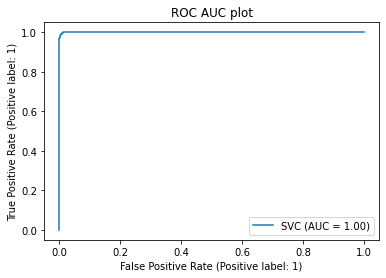

In [324]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(SVC,features_test,target_test)
plt.title("ROC AUC plot")
plt.show()

# Since we find AUCROC curve going all the way upto 1.0 on both TPR and FPR, we are good to go 

# Model saving

In [329]:
import pickle
filename = 'Mushroom_project.pkl'
pickle.dump(SVC, open(filename, 'wb'))

# Conclusion

In [330]:
import numpy as np
a = np.array(target_test)
predicted = np.array(SVC.predict(features_test))
df_con = pd.DataFrame({"Original":a, "Predicted":predicted}, index = range(len(a)))
df_con

,Original,Predicted
0,0,0
1,1,1
2,0,0
3,0,0
4,1,1
5,1,1
6,0,0
7,0,0
8,0,0
9,0,0


* From the above model we can Visualize that there is very least of error from the given Outcome